<a href="https://colab.research.google.com/github/sss23134/Masters-project-codes/blob/main/Auto_former_only_lag_as_X_.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Autoformer处理粮食期货问题

### 1.导入需要的库

In [ ]:
import pandas as pd
import torch
import matplotlib.pyplot as plt
from neuralforecast import NeuralForecast
from neuralforecast.models import Autoformer
from neuralforecast.losses.pytorch import MQLoss

### 2.导入数据

In [ ]:
# 导入数据

file_path = "oil_lagx.csv"
Y_df = pd.read_csv(file_path)


# 显示数据
print(Y_df.head())

# 检查数据基本信息
print(Y_df.info())


        date     value      lag1  lag5  lag22  scci_lag5    bdi_lag1  \
0  2018/4/18  0.997407       NaN   NaN    NaN     6.9784  356.715249   
1  2018/4/19  1.228911  0.997407   NaN    NaN    17.6785 -107.047314   
2  2018/4/20  0.942741  1.228911   NaN    NaN   -21.6329  -53.595469   
3  2018/4/21  1.264519  0.942741   NaN    NaN     7.9088  927.731720   
4  2018/4/22  1.040070  1.264519   NaN    NaN     6.5132   97.251799   

     bdi_lag2    bdi_lag3    bdi_lag4  
0  124.392595  246.029161 -299.833805  
1  356.715249  124.392595  246.029161  
2 -107.047314  356.715249  124.392595  
3 -171.766971 -253.592671  -53.595469  
4  927.731720 -171.766971 -253.592671  
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1256 entries, 0 to 1255
Data columns (total 10 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   date       1256 non-null   object 
 1   value      1256 non-null   float64
 2   lag1       1255 non-null   float64
 3   lag5       1251

### 3.数据处理

In [ ]:
# 删去最后五列
Y_df1 = Y_df.drop(Y_df.columns[-5:], axis = 1)

# 删去缺失值的行
Y_df2 = Y_df1.dropna()

# 显示数据
print(Y_df2.head())

         date     value      lag1      lag5     lag22
22  2018/5/10  2.006319  1.324862  1.562559  1.371308
23  2018/5/11  1.175668  2.006319  1.669167  1.417167
24  2018/5/12  1.328974  1.175668  1.369693  1.414747
25  2018/5/13  1.631642  1.328974  1.433459  1.432303
26  2018/5/14  1.582122  1.631642  1.493493  1.448991


In [ ]:
# 转化为d
Y_df2['date'] = pd.to_datetime(Y_df2['date'], errors='coerce')  # 将 'date' 转换为 datetime 类型
Y_df2.loc[:, 'date'] = Y_df2['date'].dt.date  # 现在可以使用 .dt 访问器
# 对齐时间

# 按日期排序
Y_df2 = Y_df2.sort_values(by='date')

# 获取从数据第一行到最后一行的日期顺序
Y_df2['date'] = pd.date_range(start=Y_df2['date'].min(), periods=len(Y_df2), freq='D')

# 查看结果
print(Y_df2)


           date     value      lag1      lag5     lag22
22   2018-05-10  2.006319  1.324862  1.562559  1.371308
23   2018-05-11  1.175668  2.006319  1.669167  1.417167
24   2018-05-12  1.328974  1.175668  1.369693  1.414747
25   2018-05-13  1.631642  1.328974  1.433459  1.432303
26   2018-05-14  1.582122  1.631642  1.493493  1.448991
...         ...       ...       ...       ...       ...
1251 2021-09-20  1.702458  1.736231  1.606785  1.846500
1252 2021-09-21  1.469298  1.702458  1.632582  1.837880
1253 2021-09-22  1.723840  1.469298  1.655817  1.815043
1254 2021-09-23  1.421625  1.723840  1.678352  1.821289
1255 2021-09-24  1.169950  1.421625  1.610690  1.804882

[1234 rows x 5 columns]


/tmp/ipykernel_15550/826687272.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_df2['date'] = pd.to_datetime(Y_df2['date'], errors='coerce')  # 将 'date' 转换为 datetime 类型


In [ ]:
# 插入新列unique_id
Y_df2.insert(0, 'unique_id', 1)

# 将date换名ds，value换成y
Y_df2 = Y_df2.rename(columns={'date': 'ds', 'value': 'y'}).reset_index(drop=True)

# 查看结果
print(Y_df2)



      unique_id         ds         y      lag1      lag5     lag22
0             1 2018-05-10  2.006319  1.324862  1.562559  1.371308
1             1 2018-05-11  1.175668  2.006319  1.669167  1.417167
2             1 2018-05-12  1.328974  1.175668  1.369693  1.414747
3             1 2018-05-13  1.631642  1.328974  1.433459  1.432303
4             1 2018-05-14  1.582122  1.631642  1.493493  1.448991
...         ...        ...       ...       ...       ...       ...
1229          1 2021-09-20  1.702458  1.736231  1.606785  1.846500
1230          1 2021-09-21  1.469298  1.702458  1.632582  1.837880
1231          1 2021-09-22  1.723840  1.469298  1.655817  1.815043
1232          1 2021-09-23  1.421625  1.723840  1.678352  1.821289
1233          1 2021-09-24  1.169950  1.421625  1.610690  1.804882

[1234 rows x 6 columns]


In [ ]:
Y_df3 = Y_df2# 特征仅lag使用

In [ ]:
# 特征滞后一个时间单位以保证本期特征预测下一期（有其他外生变量用）

# 提取y列
col = Y_df2['y']

# 删除第一个观测值
col_1 = col.drop(col.index[0])

# 将下面的观测值往上递补一位
col_2 = col_1.reset_index(drop=True)

# 将处理后的列重新赋值给DataFrame
Y_df2['y'] = col_2

# 删除最后一行
Y_df3 = Y_df2.drop(Y_df2.index[-1])


In [ ]:
# 划分训练测试集，90% 用于训练集，10% 用于测试集
train_size = int(len(Y_df3) * 0.89+8)

# 划分训练集和测试集
train_Y_df3 = Y_df3[:train_size]
test_Y_df3 = Y_df3[train_size:].reset_index(drop=True)

# 打印训练集和测试集的大小
print(f"训练集大小: {len(train_Y_df3)}")
print(f"测试集大小: {len(test_Y_df3)}")

训练集大小: 1106
测试集大小: 128


### 4.初始化模型

In [ ]:
futr_exog_list = Y_df3.columns[3:].tolist() # 历史外生变量列名列名

In [ ]:
models = [Autoformer(h=2,
                input_size = 48,
                hidden_size = 256,
                conv_hidden_size =64,
                n_head=3,
                futr_exog_list = futr_exog_list,
                loss=MQLoss(),
                scaler_type = 'robust',
                dropout = 0.3,
                max_steps=150,
                learning_rate = 1e-3,
                num_lr_decays = 3,
                batch_size = 16
                )]

Seed set to 1


###  5.滚动预测（拓展非拓展在于train_Y_df3 = Y_df3.iloc[i:train_size + i]）

In [ ]:
import time
start_time = time.time()

predictions = []

for i in range(0, len(test_Y_df3),2):
    train_Y_df3 = Y_df3.iloc[i:train_size + i]
    test_Y_df3 = Y_df3.iloc[train_size + i : ]
    nf = NeuralForecast(models=models, freq='D')
    nf.fit(df=train_Y_df3)
    Y_hat_df = nf.predict(futr_df=test_Y_df3)
    print(Y_hat_df.head)
    print(Y_hat_df.shape)
    prediction = Y_hat_df['Autoformer-median'].values.flatten()
    predictions.append(prediction)

end_time = time.time()
print(f" Code running time: {end_time - start_time} seconds")

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
You are using a CUDA device ('NVIDIA GeForce RTX 3080 Ti') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name          | Type          | Params | Mode 
--------------------------------------------------------
0 | loss          | MQLoss        | 5      | train
1 | padder_train  | ConstantPad1d | 0      | train
2 | scaler        | TemporalNorm  | 0      | train
3 | decomp        | SeriesDecomp  | 0      | train
4 | enc_embedding | DataEmbedding | 1.5 K  | train
5 | dec_embedding | DataEmbedding | 1.5 K  | train
6 | encoder       | Encoder       | 590 K  | train
7 | decod

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_steps=150` reached.
/root/miniconda3/lib/python3.12/site-packages/neuralforecast/core.py:904: UserWarning: Dropped 126 unused rows from `futr_df`.
  warnings.warn(f"Dropped {dropped_rows:,} unused rows from `futr_df`.")
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


<bound method NDFrame.head of    unique_id         ds  Autoformer-median  Autoformer-lo-90  \
0          1 2021-05-20           2.833866          2.554908   
1          1 2021-05-21           2.584024          1.882418   

   Autoformer-lo-80  Autoformer-hi-80  Autoformer-hi-90  
0          2.684224          3.076500          3.171433  
1          1.953946          3.670658          3.913626  >
(2, 7)


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name          | Type          | Params | Mode 
--------------------------------------------------------
0 | loss          | MQLoss        | 5      | train
1 | padder_train  | ConstantPad1d | 0      | train
2 | scaler        | TemporalNorm  | 0      | train
3 | decomp        | SeriesDecomp  | 0      | train
4 | enc_embedding | DataEmbedding | 1.5 K  | train
5 | dec_embedding | DataEmbedding | 1.5 K  | train
6 | encoder       | Encoder       | 590 K  | train
7 | decoder       | Decoder       | 562 K  | train
--------------------------------------------------------
1.2 M     Trainable params
5         Non-trainable params
1.2 M     Total params
4.624     Total estimated model params size (MB)
89        Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_steps=150` reached.
/root/miniconda3/lib/python3.12/site-packages/neuralforecast/core.py:904: UserWarning: Dropped 124 unused rows from `futr_df`.
  warnings.warn(f"Dropped {dropped_rows:,} unused rows from `futr_df`.")
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


<bound method NDFrame.head of    unique_id         ds  Autoformer-median  Autoformer-lo-90  \
0          1 2021-05-22           1.860194          1.787070   
1          1 2021-05-23           2.256211          1.699224   

   Autoformer-lo-80  Autoformer-hi-80  Autoformer-hi-90  
0          1.770085          2.027244          2.047123  
1          1.763801          3.063095          3.303541  >
(2, 7)


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name          | Type          | Params | Mode 
--------------------------------------------------------
0 | loss          | MQLoss        | 5      | train
1 | padder_train  | ConstantPad1d | 0      | train
2 | scaler        | TemporalNorm  | 0      | train
3 | decomp        | SeriesDecomp  | 0      | train
4 | enc_embedding | DataEmbedding | 1.5 K  | train
5 | dec_embedding | DataEmbedding | 1.5 K  | train
6 | encoder       | Encoder       | 590 K  | train
7 | decoder       | Decoder       | 562 K  | train
--------------------------------------------------------
1.2 M     Trainable params
5         Non-trainable params
1.2 M     Total params
4.624     Total estimated model params size (MB)
89        Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_steps=150` reached.
/root/miniconda3/lib/python3.12/site-packages/neuralforecast/core.py:904: UserWarning: Dropped 122 unused rows from `futr_df`.
  warnings.warn(f"Dropped {dropped_rows:,} unused rows from `futr_df`.")
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


<bound method NDFrame.head of    unique_id         ds  Autoformer-median  Autoformer-lo-90  \
0          1 2021-05-24           1.985958          1.619556   
1          1 2021-05-25           2.027736          1.636259   

   Autoformer-lo-80  Autoformer-hi-80  Autoformer-hi-90  
0          1.767254          2.338529          2.453516  
1          1.744004          2.577610          2.840569  >
(2, 7)


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name          | Type          | Params | Mode 
--------------------------------------------------------
0 | loss          | MQLoss        | 5      | train
1 | padder_train  | ConstantPad1d | 0      | train
2 | scaler        | TemporalNorm  | 0      | train
3 | decomp        | SeriesDecomp  | 0      | train
4 | enc_embedding | DataEmbedding | 1.5 K  | train
5 | dec_embedding | DataEmbedding | 1.5 K  | train
6 | encoder       | Encoder       | 590 K  | train
7 | decoder       | Decoder       | 562 K  | train
--------------------------------------------------------
1.2 M     Trainable params
5         Non-trainable params
1.2 M     Total params
4.624     Total estimated model params size (MB)
89        Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_steps=150` reached.
/root/miniconda3/lib/python3.12/site-packages/neuralforecast/core.py:904: UserWarning: Dropped 120 unused rows from `futr_df`.
  warnings.warn(f"Dropped {dropped_rows:,} unused rows from `futr_df`.")
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


<bound method NDFrame.head of    unique_id         ds  Autoformer-median  Autoformer-lo-90  \
0          1 2021-05-26           1.206519          0.936202   
1          1 2021-05-27           2.027664          1.755011   

   Autoformer-lo-80  Autoformer-hi-80  Autoformer-hi-90  
0          1.015118          1.411201          1.482114  
1          1.803775          2.905676          3.292948  >
(2, 7)


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name          | Type          | Params | Mode 
--------------------------------------------------------
0 | loss          | MQLoss        | 5      | train
1 | padder_train  | ConstantPad1d | 0      | train
2 | scaler        | TemporalNorm  | 0      | train
3 | decomp        | SeriesDecomp  | 0      | train
4 | enc_embedding | DataEmbedding | 1.5 K  | train
5 | dec_embedding | DataEmbedding | 1.5 K  | train
6 | encoder       | Encoder       | 590 K  | train
7 | decoder       | Decoder       | 562 K  | train
--------------------------------------------------------
1.2 M     Trainable params
5         Non-trainable params
1.2 M     Total params
4.624     Total estimated model params size (MB)
89        Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_steps=150` reached.
/root/miniconda3/lib/python3.12/site-packages/neuralforecast/core.py:904: UserWarning: Dropped 118 unused rows from `futr_df`.
  warnings.warn(f"Dropped {dropped_rows:,} unused rows from `futr_df`.")
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


<bound method NDFrame.head of    unique_id         ds  Autoformer-median  Autoformer-lo-90  \
0          1 2021-05-28           1.500242          1.304314   
1          1 2021-05-29           1.637626          1.339936   

   Autoformer-lo-80  Autoformer-hi-80  Autoformer-hi-90  
0          1.415391          1.604414          1.639025  
1          1.414680          2.239311          2.480252  >
(2, 7)


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name          | Type          | Params | Mode 
--------------------------------------------------------
0 | loss          | MQLoss        | 5      | train
1 | padder_train  | ConstantPad1d | 0      | train
2 | scaler        | TemporalNorm  | 0      | train
3 | decomp        | SeriesDecomp  | 0      | train
4 | enc_embedding | DataEmbedding | 1.5 K  | train
5 | dec_embedding | DataEmbedding | 1.5 K  | train
6 | encoder       | Encoder       | 590 K  | train
7 | decoder       | Decoder       | 562 K  | train
--------------------------------------------------------
1.2 M     Trainable params
5         Non-trainable params
1.2 M     Total params
4.624     Total estimated model params size (MB)
89        Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_steps=150` reached.
/root/miniconda3/lib/python3.12/site-packages/neuralforecast/core.py:904: UserWarning: Dropped 116 unused rows from `futr_df`.
  warnings.warn(f"Dropped {dropped_rows:,} unused rows from `futr_df`.")
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


<bound method NDFrame.head of    unique_id         ds  Autoformer-median  Autoformer-lo-90  \
0          1 2021-05-30           1.413236          1.070027   
1          1 2021-05-31           1.761882          1.405305   

   Autoformer-lo-80  Autoformer-hi-80  Autoformer-hi-90  
0          1.179979          1.765704          2.024673  
1          1.521722          2.187444          2.578718  >
(2, 7)


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name          | Type          | Params | Mode 
--------------------------------------------------------
0 | loss          | MQLoss        | 5      | train
1 | padder_train  | ConstantPad1d | 0      | train
2 | scaler        | TemporalNorm  | 0      | train
3 | decomp        | SeriesDecomp  | 0      | train
4 | enc_embedding | DataEmbedding | 1.5 K  | train
5 | dec_embedding | DataEmbedding | 1.5 K  | train
6 | encoder       | Encoder       | 590 K  | train
7 | decoder       | Decoder       | 562 K  | train
--------------------------------------------------------
1.2 M     Trainable params
5         Non-trainable params
1.2 M     Total params
4.624     Total estimated model params size (MB)
89        Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_steps=150` reached.
/root/miniconda3/lib/python3.12/site-packages/neuralforecast/core.py:904: UserWarning: Dropped 114 unused rows from `futr_df`.
  warnings.warn(f"Dropped {dropped_rows:,} unused rows from `futr_df`.")
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


<bound method NDFrame.head of    unique_id         ds  Autoformer-median  Autoformer-lo-90  \
0          1 2021-06-01           2.472825          2.072398   
1          1 2021-06-02           1.963652          1.424791   

   Autoformer-lo-80  Autoformer-hi-80  Autoformer-hi-90  
0          2.176411          2.891976          3.057547  
1          1.642033          2.636641          3.119221  >
(2, 7)


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name          | Type          | Params | Mode 
--------------------------------------------------------
0 | loss          | MQLoss        | 5      | train
1 | padder_train  | ConstantPad1d | 0      | train
2 | scaler        | TemporalNorm  | 0      | train
3 | decomp        | SeriesDecomp  | 0      | train
4 | enc_embedding | DataEmbedding | 1.5 K  | train
5 | dec_embedding | DataEmbedding | 1.5 K  | train
6 | encoder       | Encoder       | 590 K  | train
7 | decoder       | Decoder       | 562 K  | train
--------------------------------------------------------
1.2 M     Trainable params
5         Non-trainable params
1.2 M     Total params
4.624     Total estimated model params size (MB)
89        Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_steps=150` reached.
/root/miniconda3/lib/python3.12/site-packages/neuralforecast/core.py:904: UserWarning: Dropped 112 unused rows from `futr_df`.
  warnings.warn(f"Dropped {dropped_rows:,} unused rows from `futr_df`.")
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


<bound method NDFrame.head of    unique_id         ds  Autoformer-median  Autoformer-lo-90  \
0          1 2021-06-03           1.746698          1.181280   
1          1 2021-06-04           1.797825          1.411036   

   Autoformer-lo-80  Autoformer-hi-80  Autoformer-hi-90  
0          1.348672          2.259980          2.583797  
1          1.496613          2.374944          2.798760  >
(2, 7)


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name          | Type          | Params | Mode 
--------------------------------------------------------
0 | loss          | MQLoss        | 5      | train
1 | padder_train  | ConstantPad1d | 0      | train
2 | scaler        | TemporalNorm  | 0      | train
3 | decomp        | SeriesDecomp  | 0      | train
4 | enc_embedding | DataEmbedding | 1.5 K  | train
5 | dec_embedding | DataEmbedding | 1.5 K  | train
6 | encoder       | Encoder       | 590 K  | train
7 | decoder       | Decoder       | 562 K  | train
--------------------------------------------------------
1.2 M     Trainable params
5         Non-trainable params
1.2 M     Total params
4.624     Total estimated model params size (MB)
89        Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_steps=150` reached.
/root/miniconda3/lib/python3.12/site-packages/neuralforecast/core.py:904: UserWarning: Dropped 110 unused rows from `futr_df`.
  warnings.warn(f"Dropped {dropped_rows:,} unused rows from `futr_df`.")
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


<bound method NDFrame.head of    unique_id         ds  Autoformer-median  Autoformer-lo-90  \
0          1 2021-06-05           1.663129          1.328495   
1          1 2021-06-06           1.977358          1.615056   

   Autoformer-lo-80  Autoformer-hi-80  Autoformer-hi-90  
0          1.423516          1.987486           2.25131  
1          1.699049          2.309359           2.45889  >
(2, 7)


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name          | Type          | Params | Mode 
--------------------------------------------------------
0 | loss          | MQLoss        | 5      | train
1 | padder_train  | ConstantPad1d | 0      | train
2 | scaler        | TemporalNorm  | 0      | train
3 | decomp        | SeriesDecomp  | 0      | train
4 | enc_embedding | DataEmbedding | 1.5 K  | train
5 | dec_embedding | DataEmbedding | 1.5 K  | train
6 | encoder       | Encoder       | 590 K  | train
7 | decoder       | Decoder       | 562 K  | train
--------------------------------------------------------
1.2 M     Trainable params
5         Non-trainable params
1.2 M     Total params
4.624     Total estimated model params size (MB)
89        Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_steps=150` reached.
/root/miniconda3/lib/python3.12/site-packages/neuralforecast/core.py:904: UserWarning: Dropped 108 unused rows from `futr_df`.
  warnings.warn(f"Dropped {dropped_rows:,} unused rows from `futr_df`.")
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


<bound method NDFrame.head of    unique_id         ds  Autoformer-median  Autoformer-lo-90  \
0          1 2021-06-07           1.953050          1.531214   
1          1 2021-06-08           1.811296          1.094184   

   Autoformer-lo-80  Autoformer-hi-80  Autoformer-hi-90  
0          1.730771          2.208182          2.434027  
1          1.300072          2.545254          3.053841  >
(2, 7)


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name          | Type          | Params | Mode 
--------------------------------------------------------
0 | loss          | MQLoss        | 5      | train
1 | padder_train  | ConstantPad1d | 0      | train
2 | scaler        | TemporalNorm  | 0      | train
3 | decomp        | SeriesDecomp  | 0      | train
4 | enc_embedding | DataEmbedding | 1.5 K  | train
5 | dec_embedding | DataEmbedding | 1.5 K  | train
6 | encoder       | Encoder       | 590 K  | train
7 | decoder       | Decoder       | 562 K  | train
--------------------------------------------------------
1.2 M     Trainable params
5         Non-trainable params
1.2 M     Total params
4.624     Total estimated model params size (MB)
89        Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_steps=150` reached.
/root/miniconda3/lib/python3.12/site-packages/neuralforecast/core.py:904: UserWarning: Dropped 106 unused rows from `futr_df`.
  warnings.warn(f"Dropped {dropped_rows:,} unused rows from `futr_df`.")
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


<bound method NDFrame.head of    unique_id         ds  Autoformer-median  Autoformer-lo-90  \
0          1 2021-06-09           1.036326          0.843943   
1          1 2021-06-10           1.806700          1.532579   

   Autoformer-lo-80  Autoformer-hi-80  Autoformer-hi-90  
0          0.894196          1.222341          1.292109  
1          1.576817          2.212697          2.273688  >
(2, 7)


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name          | Type          | Params | Mode 
--------------------------------------------------------
0 | loss          | MQLoss        | 5      | train
1 | padder_train  | ConstantPad1d | 0      | train
2 | scaler        | TemporalNorm  | 0      | train
3 | decomp        | SeriesDecomp  | 0      | train
4 | enc_embedding | DataEmbedding | 1.5 K  | train
5 | dec_embedding | DataEmbedding | 1.5 K  | train
6 | encoder       | Encoder       | 590 K  | train
7 | decoder       | Decoder       | 562 K  | train
--------------------------------------------------------
1.2 M     Trainable params
5         Non-trainable params
1.2 M     Total params
4.624     Total estimated model params size (MB)
89        Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_steps=150` reached.
/root/miniconda3/lib/python3.12/site-packages/neuralforecast/core.py:904: UserWarning: Dropped 104 unused rows from `futr_df`.
  warnings.warn(f"Dropped {dropped_rows:,} unused rows from `futr_df`.")
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


<bound method NDFrame.head of    unique_id         ds  Autoformer-median  Autoformer-lo-90  \
0          1 2021-06-11           1.884469          1.587632   
1          1 2021-06-12           1.817125          1.197760   

   Autoformer-lo-80  Autoformer-hi-80  Autoformer-hi-90  
0          1.609419           1.98673          2.160727  
1          1.295668           2.52908          2.810727  >
(2, 7)


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name          | Type          | Params | Mode 
--------------------------------------------------------
0 | loss          | MQLoss        | 5      | train
1 | padder_train  | ConstantPad1d | 0      | train
2 | scaler        | TemporalNorm  | 0      | train
3 | decomp        | SeriesDecomp  | 0      | train
4 | enc_embedding | DataEmbedding | 1.5 K  | train
5 | dec_embedding | DataEmbedding | 1.5 K  | train
6 | encoder       | Encoder       | 590 K  | train
7 | decoder       | Decoder       | 562 K  | train
--------------------------------------------------------
1.2 M     Trainable params
5         Non-trainable params
1.2 M     Total params
4.624     Total estimated model params size (MB)
89        Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_steps=150` reached.
/root/miniconda3/lib/python3.12/site-packages/neuralforecast/core.py:904: UserWarning: Dropped 102 unused rows from `futr_df`.
  warnings.warn(f"Dropped {dropped_rows:,} unused rows from `futr_df`.")
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


<bound method NDFrame.head of    unique_id         ds  Autoformer-median  Autoformer-lo-90  \
0          1 2021-06-13           1.423206          1.180173   
1          1 2021-06-14           1.618356          1.083805   

   Autoformer-lo-80  Autoformer-hi-80  Autoformer-hi-90  
0          1.280819          1.652741          1.834481  
1          1.204361          2.378780          2.787008  >
(2, 7)


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name          | Type          | Params | Mode 
--------------------------------------------------------
0 | loss          | MQLoss        | 5      | train
1 | padder_train  | ConstantPad1d | 0      | train
2 | scaler        | TemporalNorm  | 0      | train
3 | decomp        | SeriesDecomp  | 0      | train
4 | enc_embedding | DataEmbedding | 1.5 K  | train
5 | dec_embedding | DataEmbedding | 1.5 K  | train
6 | encoder       | Encoder       | 590 K  | train
7 | decoder       | Decoder       | 562 K  | train
--------------------------------------------------------
1.2 M     Trainable params
5         Non-trainable params
1.2 M     Total params
4.624     Total estimated model params size (MB)
89        Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_steps=150` reached.
/root/miniconda3/lib/python3.12/site-packages/neuralforecast/core.py:904: UserWarning: Dropped 100 unused rows from `futr_df`.
  warnings.warn(f"Dropped {dropped_rows:,} unused rows from `futr_df`.")
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


<bound method NDFrame.head of    unique_id         ds  Autoformer-median  Autoformer-lo-90  \
0          1 2021-06-15           1.221114          0.999991   
1          1 2021-06-16           1.462186          1.017030   

   Autoformer-lo-80  Autoformer-hi-80  Autoformer-hi-90  
0          1.103960          1.336145          1.512587  
1          1.116234          2.381292          2.887745  >
(2, 7)


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name          | Type          | Params | Mode 
--------------------------------------------------------
0 | loss          | MQLoss        | 5      | train
1 | padder_train  | ConstantPad1d | 0      | train
2 | scaler        | TemporalNorm  | 0      | train
3 | decomp        | SeriesDecomp  | 0      | train
4 | enc_embedding | DataEmbedding | 1.5 K  | train
5 | dec_embedding | DataEmbedding | 1.5 K  | train
6 | encoder       | Encoder       | 590 K  | train
7 | decoder       | Decoder       | 562 K  | train
--------------------------------------------------------
1.2 M     Trainable params
5         Non-trainable params
1.2 M     Total params
4.624     Total estimated model params size (MB)
89        Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_steps=150` reached.
/root/miniconda3/lib/python3.12/site-packages/neuralforecast/core.py:904: UserWarning: Dropped 98 unused rows from `futr_df`.
  warnings.warn(f"Dropped {dropped_rows:,} unused rows from `futr_df`.")
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


<bound method NDFrame.head of    unique_id         ds  Autoformer-median  Autoformer-lo-90  \
0          1 2021-06-17           1.927401          1.350853   
1          1 2021-06-18           1.193006          0.794770   

   Autoformer-lo-80  Autoformer-hi-80  Autoformer-hi-90  
0          1.543598          2.396895          2.828455  
1          0.887196          1.844676          2.305170  >
(2, 7)


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name          | Type          | Params | Mode 
--------------------------------------------------------
0 | loss          | MQLoss        | 5      | train
1 | padder_train  | ConstantPad1d | 0      | train
2 | scaler        | TemporalNorm  | 0      | train
3 | decomp        | SeriesDecomp  | 0      | train
4 | enc_embedding | DataEmbedding | 1.5 K  | train
5 | dec_embedding | DataEmbedding | 1.5 K  | train
6 | encoder       | Encoder       | 590 K  | train
7 | decoder       | Decoder       | 562 K  | train
--------------------------------------------------------
1.2 M     Trainable params
5         Non-trainable params
1.2 M     Total params
4.624     Total estimated model params size (MB)
89        Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_steps=150` reached.
/root/miniconda3/lib/python3.12/site-packages/neuralforecast/core.py:904: UserWarning: Dropped 96 unused rows from `futr_df`.
  warnings.warn(f"Dropped {dropped_rows:,} unused rows from `futr_df`.")
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


<bound method NDFrame.head of    unique_id         ds  Autoformer-median  Autoformer-lo-90  \
0          1 2021-06-19            1.81568          1.515156   
1          1 2021-06-20            1.74844          1.131405   

   Autoformer-lo-80  Autoformer-hi-80  Autoformer-hi-90  
0          1.570201          2.205664          2.368014  
1          1.240470          2.682954          3.136176  >
(2, 7)


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name          | Type          | Params | Mode 
--------------------------------------------------------
0 | loss          | MQLoss        | 5      | train
1 | padder_train  | ConstantPad1d | 0      | train
2 | scaler        | TemporalNorm  | 0      | train
3 | decomp        | SeriesDecomp  | 0      | train
4 | enc_embedding | DataEmbedding | 1.5 K  | train
5 | dec_embedding | DataEmbedding | 1.5 K  | train
6 | encoder       | Encoder       | 590 K  | train
7 | decoder       | Decoder       | 562 K  | train
--------------------------------------------------------
1.2 M     Trainable params
5         Non-trainable params
1.2 M     Total params
4.624     Total estimated model params size (MB)
89        Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_steps=150` reached.
/root/miniconda3/lib/python3.12/site-packages/neuralforecast/core.py:904: UserWarning: Dropped 94 unused rows from `futr_df`.
  warnings.warn(f"Dropped {dropped_rows:,} unused rows from `futr_df`.")
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


<bound method NDFrame.head of    unique_id         ds  Autoformer-median  Autoformer-lo-90  \
0          1 2021-06-21           1.190741          0.855111   
1          1 2021-06-22           1.608597          1.031718   

   Autoformer-lo-80  Autoformer-hi-80  Autoformer-hi-90  
0          0.970329          1.484730          1.623673  
1          1.125767          2.515579          2.926735  >
(2, 7)


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name          | Type          | Params | Mode 
--------------------------------------------------------
0 | loss          | MQLoss        | 5      | train
1 | padder_train  | ConstantPad1d | 0      | train
2 | scaler        | TemporalNorm  | 0      | train
3 | decomp        | SeriesDecomp  | 0      | train
4 | enc_embedding | DataEmbedding | 1.5 K  | train
5 | dec_embedding | DataEmbedding | 1.5 K  | train
6 | encoder       | Encoder       | 590 K  | train
7 | decoder       | Decoder       | 562 K  | train
--------------------------------------------------------
1.2 M     Trainable params
5         Non-trainable params
1.2 M     Total params
4.624     Total estimated model params size (MB)
89        Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_steps=150` reached.
/root/miniconda3/lib/python3.12/site-packages/neuralforecast/core.py:904: UserWarning: Dropped 92 unused rows from `futr_df`.
  warnings.warn(f"Dropped {dropped_rows:,} unused rows from `futr_df`.")
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


<bound method NDFrame.head of    unique_id         ds  Autoformer-median  Autoformer-lo-90  \
0          1 2021-06-23           2.461433          2.032770   
1          1 2021-06-24           1.422302          0.760251   

   Autoformer-lo-80  Autoformer-hi-80  Autoformer-hi-90  
0          2.140436          2.639156          2.640682  
1          0.851962          2.154254          2.562942  >
(2, 7)


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name          | Type          | Params | Mode 
--------------------------------------------------------
0 | loss          | MQLoss        | 5      | train
1 | padder_train  | ConstantPad1d | 0      | train
2 | scaler        | TemporalNorm  | 0      | train
3 | decomp        | SeriesDecomp  | 0      | train
4 | enc_embedding | DataEmbedding | 1.5 K  | train
5 | dec_embedding | DataEmbedding | 1.5 K  | train
6 | encoder       | Encoder       | 590 K  | train
7 | decoder       | Decoder       | 562 K  | train
--------------------------------------------------------
1.2 M     Trainable params
5         Non-trainable params
1.2 M     Total params
4.624     Total estimated model params size (MB)
89        Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_steps=150` reached.
/root/miniconda3/lib/python3.12/site-packages/neuralforecast/core.py:904: UserWarning: Dropped 90 unused rows from `futr_df`.
  warnings.warn(f"Dropped {dropped_rows:,} unused rows from `futr_df`.")
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


<bound method NDFrame.head of    unique_id         ds  Autoformer-median  Autoformer-lo-90  \
0          1 2021-06-25           1.606778          1.276442   
1          1 2021-06-26           1.659399          1.155575   

   Autoformer-lo-80  Autoformer-hi-80  Autoformer-hi-90  
0          1.408442          1.950378          2.198497  
1          1.287072          2.264369          2.589195  >
(2, 7)


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name          | Type          | Params | Mode 
--------------------------------------------------------
0 | loss          | MQLoss        | 5      | train
1 | padder_train  | ConstantPad1d | 0      | train
2 | scaler        | TemporalNorm  | 0      | train
3 | decomp        | SeriesDecomp  | 0      | train
4 | enc_embedding | DataEmbedding | 1.5 K  | train
5 | dec_embedding | DataEmbedding | 1.5 K  | train
6 | encoder       | Encoder       | 590 K  | train
7 | decoder       | Decoder       | 562 K  | train
--------------------------------------------------------
1.2 M     Trainable params
5         Non-trainable params
1.2 M     Total params
4.624     Total estimated model params size (MB)
89        Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_steps=150` reached.
/root/miniconda3/lib/python3.12/site-packages/neuralforecast/core.py:904: UserWarning: Dropped 88 unused rows from `futr_df`.
  warnings.warn(f"Dropped {dropped_rows:,} unused rows from `futr_df`.")
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


<bound method NDFrame.head of    unique_id         ds  Autoformer-median  Autoformer-lo-90  \
0          1 2021-06-27           1.138862          0.708534   
1          1 2021-06-28           1.417391          1.054850   

   Autoformer-lo-80  Autoformer-hi-80  Autoformer-hi-90  
0          0.839717          1.378198          1.511113  
1          1.153778          1.867277          1.964648  >
(2, 7)


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name          | Type          | Params | Mode 
--------------------------------------------------------
0 | loss          | MQLoss        | 5      | train
1 | padder_train  | ConstantPad1d | 0      | train
2 | scaler        | TemporalNorm  | 0      | train
3 | decomp        | SeriesDecomp  | 0      | train
4 | enc_embedding | DataEmbedding | 1.5 K  | train
5 | dec_embedding | DataEmbedding | 1.5 K  | train
6 | encoder       | Encoder       | 590 K  | train
7 | decoder       | Decoder       | 562 K  | train
--------------------------------------------------------
1.2 M     Trainable params
5         Non-trainable params
1.2 M     Total params
4.624     Total estimated model params size (MB)
89        Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_steps=150` reached.
/root/miniconda3/lib/python3.12/site-packages/neuralforecast/core.py:904: UserWarning: Dropped 86 unused rows from `futr_df`.
  warnings.warn(f"Dropped {dropped_rows:,} unused rows from `futr_df`.")
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


<bound method NDFrame.head of    unique_id         ds  Autoformer-median  Autoformer-lo-90  \
0          1 2021-06-29           1.025875          0.862445   
1          1 2021-06-30           1.431470          1.022906   

   Autoformer-lo-80  Autoformer-hi-80  Autoformer-hi-90  
0          0.920995          1.055550          1.137677  
1          1.111276          2.037445          2.198002  >
(2, 7)


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name          | Type          | Params | Mode 
--------------------------------------------------------
0 | loss          | MQLoss        | 5      | train
1 | padder_train  | ConstantPad1d | 0      | train
2 | scaler        | TemporalNorm  | 0      | train
3 | decomp        | SeriesDecomp  | 0      | train
4 | enc_embedding | DataEmbedding | 1.5 K  | train
5 | dec_embedding | DataEmbedding | 1.5 K  | train
6 | encoder       | Encoder       | 590 K  | train
7 | decoder       | Decoder       | 562 K  | train
--------------------------------------------------------
1.2 M     Trainable params
5         Non-trainable params
1.2 M     Total params
4.624     Total estimated model params size (MB)
89        Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_steps=150` reached.
/root/miniconda3/lib/python3.12/site-packages/neuralforecast/core.py:904: UserWarning: Dropped 84 unused rows from `futr_df`.
  warnings.warn(f"Dropped {dropped_rows:,} unused rows from `futr_df`.")
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


<bound method NDFrame.head of    unique_id         ds  Autoformer-median  Autoformer-lo-90  \
0          1 2021-07-01           1.073234          0.750140   
1          1 2021-07-02           1.109715          0.683975   

   Autoformer-lo-80  Autoformer-hi-80  Autoformer-hi-90  
0          0.853636          1.262093          1.434348  
1          0.783860          1.622759          1.833036  >
(2, 7)


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name          | Type          | Params | Mode 
--------------------------------------------------------
0 | loss          | MQLoss        | 5      | train
1 | padder_train  | ConstantPad1d | 0      | train
2 | scaler        | TemporalNorm  | 0      | train
3 | decomp        | SeriesDecomp  | 0      | train
4 | enc_embedding | DataEmbedding | 1.5 K  | train
5 | dec_embedding | DataEmbedding | 1.5 K  | train
6 | encoder       | Encoder       | 590 K  | train
7 | decoder       | Decoder       | 562 K  | train
--------------------------------------------------------
1.2 M     Trainable params
5         Non-trainable params
1.2 M     Total params
4.624     Total estimated model params size (MB)
89        Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_steps=150` reached.
/root/miniconda3/lib/python3.12/site-packages/neuralforecast/core.py:904: UserWarning: Dropped 82 unused rows from `futr_df`.
  warnings.warn(f"Dropped {dropped_rows:,} unused rows from `futr_df`.")
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


<bound method NDFrame.head of    unique_id         ds  Autoformer-median  Autoformer-lo-90  \
0          1 2021-07-03           1.278120          0.885439   
1          1 2021-07-04           1.351153          0.953391   

   Autoformer-lo-80  Autoformer-hi-80  Autoformer-hi-90  
0          1.046761          1.670415          1.822175  
1          1.086783          1.853358          2.149475  >
(2, 7)


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name          | Type          | Params | Mode 
--------------------------------------------------------
0 | loss          | MQLoss        | 5      | train
1 | padder_train  | ConstantPad1d | 0      | train
2 | scaler        | TemporalNorm  | 0      | train
3 | decomp        | SeriesDecomp  | 0      | train
4 | enc_embedding | DataEmbedding | 1.5 K  | train
5 | dec_embedding | DataEmbedding | 1.5 K  | train
6 | encoder       | Encoder       | 590 K  | train
7 | decoder       | Decoder       | 562 K  | train
--------------------------------------------------------
1.2 M     Trainable params
5         Non-trainable params
1.2 M     Total params
4.624     Total estimated model params size (MB)
89        Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_steps=150` reached.
/root/miniconda3/lib/python3.12/site-packages/neuralforecast/core.py:904: UserWarning: Dropped 80 unused rows from `futr_df`.
  warnings.warn(f"Dropped {dropped_rows:,} unused rows from `futr_df`.")
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


<bound method NDFrame.head of    unique_id         ds  Autoformer-median  Autoformer-lo-90  \
0          1 2021-07-05           1.504677          1.207699   
1          1 2021-07-06           1.416298          0.924739   

   Autoformer-lo-80  Autoformer-hi-80  Autoformer-hi-90  
0          1.284928          1.741326          1.910528  
1          1.011424          1.959006          2.254555  >
(2, 7)


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name          | Type          | Params | Mode 
--------------------------------------------------------
0 | loss          | MQLoss        | 5      | train
1 | padder_train  | ConstantPad1d | 0      | train
2 | scaler        | TemporalNorm  | 0      | train
3 | decomp        | SeriesDecomp  | 0      | train
4 | enc_embedding | DataEmbedding | 1.5 K  | train
5 | dec_embedding | DataEmbedding | 1.5 K  | train
6 | encoder       | Encoder       | 590 K  | train
7 | decoder       | Decoder       | 562 K  | train
--------------------------------------------------------
1.2 M     Trainable params
5         Non-trainable params
1.2 M     Total params
4.624     Total estimated model params size (MB)
89        Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_steps=150` reached.
/root/miniconda3/lib/python3.12/site-packages/neuralforecast/core.py:904: UserWarning: Dropped 78 unused rows from `futr_df`.
  warnings.warn(f"Dropped {dropped_rows:,} unused rows from `futr_df`.")
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


<bound method NDFrame.head of    unique_id         ds  Autoformer-median  Autoformer-lo-90  \
0          1 2021-07-07           1.017161          0.832937   
1          1 2021-07-08           1.370732          0.936673   

   Autoformer-lo-80  Autoformer-hi-80  Autoformer-hi-90  
0          0.875065          1.153530          1.199105  
1          1.035862          2.037326          2.437532  >
(2, 7)


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name          | Type          | Params | Mode 
--------------------------------------------------------
0 | loss          | MQLoss        | 5      | train
1 | padder_train  | ConstantPad1d | 0      | train
2 | scaler        | TemporalNorm  | 0      | train
3 | decomp        | SeriesDecomp  | 0      | train
4 | enc_embedding | DataEmbedding | 1.5 K  | train
5 | dec_embedding | DataEmbedding | 1.5 K  | train
6 | encoder       | Encoder       | 590 K  | train
7 | decoder       | Decoder       | 562 K  | train
--------------------------------------------------------
1.2 M     Trainable params
5         Non-trainable params
1.2 M     Total params
4.624     Total estimated model params size (MB)
89        Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_steps=150` reached.
/root/miniconda3/lib/python3.12/site-packages/neuralforecast/core.py:904: UserWarning: Dropped 76 unused rows from `futr_df`.
  warnings.warn(f"Dropped {dropped_rows:,} unused rows from `futr_df`.")
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


<bound method NDFrame.head of    unique_id         ds  Autoformer-median  Autoformer-lo-90  \
0          1 2021-07-09           1.228536          1.006553   
1          1 2021-07-10           1.306707          0.783737   

   Autoformer-lo-80  Autoformer-hi-80  Autoformer-hi-90  
0          1.095297           1.35505          1.448586  
1          0.929807           1.91718          2.305889  >
(2, 7)


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name          | Type          | Params | Mode 
--------------------------------------------------------
0 | loss          | MQLoss        | 5      | train
1 | padder_train  | ConstantPad1d | 0      | train
2 | scaler        | TemporalNorm  | 0      | train
3 | decomp        | SeriesDecomp  | 0      | train
4 | enc_embedding | DataEmbedding | 1.5 K  | train
5 | dec_embedding | DataEmbedding | 1.5 K  | train
6 | encoder       | Encoder       | 590 K  | train
7 | decoder       | Decoder       | 562 K  | train
--------------------------------------------------------
1.2 M     Trainable params
5         Non-trainable params
1.2 M     Total params
4.624     Total estimated model params size (MB)
89        Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_steps=150` reached.
/root/miniconda3/lib/python3.12/site-packages/neuralforecast/core.py:904: UserWarning: Dropped 74 unused rows from `futr_df`.
  warnings.warn(f"Dropped {dropped_rows:,} unused rows from `futr_df`.")
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


<bound method NDFrame.head of    unique_id         ds  Autoformer-median  Autoformer-lo-90  \
0          1 2021-07-11           1.293000          0.995335   
1          1 2021-07-12           1.386732          1.050356   

   Autoformer-lo-80  Autoformer-hi-80  Autoformer-hi-90  
0          1.110825          1.484322          1.666927  
1          1.148380          1.743924          2.006203  >
(2, 7)


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name          | Type          | Params | Mode 
--------------------------------------------------------
0 | loss          | MQLoss        | 5      | train
1 | padder_train  | ConstantPad1d | 0      | train
2 | scaler        | TemporalNorm  | 0      | train
3 | decomp        | SeriesDecomp  | 0      | train
4 | enc_embedding | DataEmbedding | 1.5 K  | train
5 | dec_embedding | DataEmbedding | 1.5 K  | train
6 | encoder       | Encoder       | 590 K  | train
7 | decoder       | Decoder       | 562 K  | train
--------------------------------------------------------
1.2 M     Trainable params
5         Non-trainable params
1.2 M     Total params
4.624     Total estimated model params size (MB)
89        Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_steps=150` reached.
/root/miniconda3/lib/python3.12/site-packages/neuralforecast/core.py:904: UserWarning: Dropped 72 unused rows from `futr_df`.
  warnings.warn(f"Dropped {dropped_rows:,} unused rows from `futr_df`.")
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


<bound method NDFrame.head of    unique_id         ds  Autoformer-median  Autoformer-lo-90  \
0          1 2021-07-13           1.727409          1.583871   
1          1 2021-07-14           1.572697          1.178151   

   Autoformer-lo-80  Autoformer-hi-80  Autoformer-hi-90  
0          1.655054          1.799428          1.872445  
1          1.279150          1.986690          2.169095  >
(2, 7)


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name          | Type          | Params | Mode 
--------------------------------------------------------
0 | loss          | MQLoss        | 5      | train
1 | padder_train  | ConstantPad1d | 0      | train
2 | scaler        | TemporalNorm  | 0      | train
3 | decomp        | SeriesDecomp  | 0      | train
4 | enc_embedding | DataEmbedding | 1.5 K  | train
5 | dec_embedding | DataEmbedding | 1.5 K  | train
6 | encoder       | Encoder       | 590 K  | train
7 | decoder       | Decoder       | 562 K  | train
--------------------------------------------------------
1.2 M     Trainable params
5         Non-trainable params
1.2 M     Total params
4.624     Total estimated model params size (MB)
89        Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_steps=150` reached.
/root/miniconda3/lib/python3.12/site-packages/neuralforecast/core.py:904: UserWarning: Dropped 70 unused rows from `futr_df`.
  warnings.warn(f"Dropped {dropped_rows:,} unused rows from `futr_df`.")
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


<bound method NDFrame.head of    unique_id         ds  Autoformer-median  Autoformer-lo-90  \
0          1 2021-07-15           1.884302          1.399297   
1          1 2021-07-16           1.957671          1.433626   

   Autoformer-lo-80  Autoformer-hi-80  Autoformer-hi-90  
0          1.558724          2.087636          2.130410  
1          1.660545          2.242483          2.288074  >
(2, 7)


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name          | Type          | Params | Mode 
--------------------------------------------------------
0 | loss          | MQLoss        | 5      | train
1 | padder_train  | ConstantPad1d | 0      | train
2 | scaler        | TemporalNorm  | 0      | train
3 | decomp        | SeriesDecomp  | 0      | train
4 | enc_embedding | DataEmbedding | 1.5 K  | train
5 | dec_embedding | DataEmbedding | 1.5 K  | train
6 | encoder       | Encoder       | 590 K  | train
7 | decoder       | Decoder       | 562 K  | train
--------------------------------------------------------
1.2 M     Trainable params
5         Non-trainable params
1.2 M     Total params
4.624     Total estimated model params size (MB)
89        Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_steps=150` reached.
/root/miniconda3/lib/python3.12/site-packages/neuralforecast/core.py:904: UserWarning: Dropped 68 unused rows from `futr_df`.
  warnings.warn(f"Dropped {dropped_rows:,} unused rows from `futr_df`.")
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


<bound method NDFrame.head of    unique_id         ds  Autoformer-median  Autoformer-lo-90  \
0          1 2021-07-17           2.539576          1.968136   
1          1 2021-07-18           2.222499          1.312532   

   Autoformer-lo-80  Autoformer-hi-80  Autoformer-hi-90  
0          2.138938          2.678837          2.787420  
1          1.420368          3.194106          3.734677  >
(2, 7)


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name          | Type          | Params | Mode 
--------------------------------------------------------
0 | loss          | MQLoss        | 5      | train
1 | padder_train  | ConstantPad1d | 0      | train
2 | scaler        | TemporalNorm  | 0      | train
3 | decomp        | SeriesDecomp  | 0      | train
4 | enc_embedding | DataEmbedding | 1.5 K  | train
5 | dec_embedding | DataEmbedding | 1.5 K  | train
6 | encoder       | Encoder       | 590 K  | train
7 | decoder       | Decoder       | 562 K  | train
--------------------------------------------------------
1.2 M     Trainable params
5         Non-trainable params
1.2 M     Total params
4.624     Total estimated model params size (MB)
89        Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_steps=150` reached.
/root/miniconda3/lib/python3.12/site-packages/neuralforecast/core.py:904: UserWarning: Dropped 66 unused rows from `futr_df`.
  warnings.warn(f"Dropped {dropped_rows:,} unused rows from `futr_df`.")
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


<bound method NDFrame.head of    unique_id         ds  Autoformer-median  Autoformer-lo-90  \
0          1 2021-07-19           2.891839          2.313492   
1          1 2021-07-20           2.365451          1.474797   

   Autoformer-lo-80  Autoformer-hi-80  Autoformer-hi-90  
0          2.559226          3.181246          3.504054  
1          1.650564          3.287616          3.738332  >
(2, 7)


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name          | Type          | Params | Mode 
--------------------------------------------------------
0 | loss          | MQLoss        | 5      | train
1 | padder_train  | ConstantPad1d | 0      | train
2 | scaler        | TemporalNorm  | 0      | train
3 | decomp        | SeriesDecomp  | 0      | train
4 | enc_embedding | DataEmbedding | 1.5 K  | train
5 | dec_embedding | DataEmbedding | 1.5 K  | train
6 | encoder       | Encoder       | 590 K  | train
7 | decoder       | Decoder       | 562 K  | train
--------------------------------------------------------
1.2 M     Trainable params
5         Non-trainable params
1.2 M     Total params
4.624     Total estimated model params size (MB)
89        Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_steps=150` reached.
/root/miniconda3/lib/python3.12/site-packages/neuralforecast/core.py:904: UserWarning: Dropped 64 unused rows from `futr_df`.
  warnings.warn(f"Dropped {dropped_rows:,} unused rows from `futr_df`.")
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


<bound method NDFrame.head of    unique_id         ds  Autoformer-median  Autoformer-lo-90  \
0          1 2021-07-21           1.525680          1.095956   
1          1 2021-07-22           1.873008          1.397064   

   Autoformer-lo-80  Autoformer-hi-80  Autoformer-hi-90  
0          1.188181          1.880289          2.074847  
1          1.458102          2.315011          2.583509  >
(2, 7)


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name          | Type          | Params | Mode 
--------------------------------------------------------
0 | loss          | MQLoss        | 5      | train
1 | padder_train  | ConstantPad1d | 0      | train
2 | scaler        | TemporalNorm  | 0      | train
3 | decomp        | SeriesDecomp  | 0      | train
4 | enc_embedding | DataEmbedding | 1.5 K  | train
5 | dec_embedding | DataEmbedding | 1.5 K  | train
6 | encoder       | Encoder       | 590 K  | train
7 | decoder       | Decoder       | 562 K  | train
--------------------------------------------------------
1.2 M     Trainable params
5         Non-trainable params
1.2 M     Total params
4.624     Total estimated model params size (MB)
89        Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_steps=150` reached.
/root/miniconda3/lib/python3.12/site-packages/neuralforecast/core.py:904: UserWarning: Dropped 62 unused rows from `futr_df`.
  warnings.warn(f"Dropped {dropped_rows:,} unused rows from `futr_df`.")
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


<bound method NDFrame.head of    unique_id         ds  Autoformer-median  Autoformer-lo-90  \
0          1 2021-07-23           2.591211          2.125667   
1          1 2021-07-24           2.226616          1.550744   

   Autoformer-lo-80  Autoformer-hi-80  Autoformer-hi-90  
0          2.293097          2.849326          3.125496  
1          1.699389          2.929467          3.098775  >
(2, 7)


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name          | Type          | Params | Mode 
--------------------------------------------------------
0 | loss          | MQLoss        | 5      | train
1 | padder_train  | ConstantPad1d | 0      | train
2 | scaler        | TemporalNorm  | 0      | train
3 | decomp        | SeriesDecomp  | 0      | train
4 | enc_embedding | DataEmbedding | 1.5 K  | train
5 | dec_embedding | DataEmbedding | 1.5 K  | train
6 | encoder       | Encoder       | 590 K  | train
7 | decoder       | Decoder       | 562 K  | train
--------------------------------------------------------
1.2 M     Trainable params
5         Non-trainable params
1.2 M     Total params
4.624     Total estimated model params size (MB)
89        Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_steps=150` reached.
/root/miniconda3/lib/python3.12/site-packages/neuralforecast/core.py:904: UserWarning: Dropped 60 unused rows from `futr_df`.
  warnings.warn(f"Dropped {dropped_rows:,} unused rows from `futr_df`.")
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


<bound method NDFrame.head of    unique_id         ds  Autoformer-median  Autoformer-lo-90  \
0          1 2021-07-25           1.163798          0.805701   
1          1 2021-07-26           1.564171          1.114357   

   Autoformer-lo-80  Autoformer-hi-80  Autoformer-hi-90  
0          0.958004          1.520879          1.696745  
1          1.167653          1.883018          1.878220  >
(2, 7)


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name          | Type          | Params | Mode 
--------------------------------------------------------
0 | loss          | MQLoss        | 5      | train
1 | padder_train  | ConstantPad1d | 0      | train
2 | scaler        | TemporalNorm  | 0      | train
3 | decomp        | SeriesDecomp  | 0      | train
4 | enc_embedding | DataEmbedding | 1.5 K  | train
5 | dec_embedding | DataEmbedding | 1.5 K  | train
6 | encoder       | Encoder       | 590 K  | train
7 | decoder       | Decoder       | 562 K  | train
--------------------------------------------------------
1.2 M     Trainable params
5         Non-trainable params
1.2 M     Total params
4.624     Total estimated model params size (MB)
89        Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_steps=150` reached.
/root/miniconda3/lib/python3.12/site-packages/neuralforecast/core.py:904: UserWarning: Dropped 58 unused rows from `futr_df`.
  warnings.warn(f"Dropped {dropped_rows:,} unused rows from `futr_df`.")
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


<bound method NDFrame.head of    unique_id         ds  Autoformer-median  Autoformer-lo-90  \
0          1 2021-07-27           1.524549          1.399511   
1          1 2021-07-28           1.847985          1.077503   

   Autoformer-lo-80  Autoformer-hi-80  Autoformer-hi-90  
0          1.445540          1.620276          1.755889  
1          1.180393          2.626844          2.970341  >
(2, 7)


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name          | Type          | Params | Mode 
--------------------------------------------------------
0 | loss          | MQLoss        | 5      | train
1 | padder_train  | ConstantPad1d | 0      | train
2 | scaler        | TemporalNorm  | 0      | train
3 | decomp        | SeriesDecomp  | 0      | train
4 | enc_embedding | DataEmbedding | 1.5 K  | train
5 | dec_embedding | DataEmbedding | 1.5 K  | train
6 | encoder       | Encoder       | 590 K  | train
7 | decoder       | Decoder       | 562 K  | train
--------------------------------------------------------
1.2 M     Trainable params
5         Non-trainable params
1.2 M     Total params
4.624     Total estimated model params size (MB)
89        Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_steps=150` reached.
/root/miniconda3/lib/python3.12/site-packages/neuralforecast/core.py:904: UserWarning: Dropped 56 unused rows from `futr_df`.
  warnings.warn(f"Dropped {dropped_rows:,} unused rows from `futr_df`.")
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


<bound method NDFrame.head of    unique_id         ds  Autoformer-median  Autoformer-lo-90  \
0          1 2021-07-29           1.460899          0.885494   
1          1 2021-07-30           1.942054          1.144470   

   Autoformer-lo-80  Autoformer-hi-80  Autoformer-hi-90  
0          1.031383          1.961189          2.216470  
1          1.204318          3.036413          3.716789  >
(2, 7)


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name          | Type          | Params | Mode 
--------------------------------------------------------
0 | loss          | MQLoss        | 5      | train
1 | padder_train  | ConstantPad1d | 0      | train
2 | scaler        | TemporalNorm  | 0      | train
3 | decomp        | SeriesDecomp  | 0      | train
4 | enc_embedding | DataEmbedding | 1.5 K  | train
5 | dec_embedding | DataEmbedding | 1.5 K  | train
6 | encoder       | Encoder       | 590 K  | train
7 | decoder       | Decoder       | 562 K  | train
--------------------------------------------------------
1.2 M     Trainable params
5         Non-trainable params
1.2 M     Total params
4.624     Total estimated model params size (MB)
89        Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_steps=150` reached.
/root/miniconda3/lib/python3.12/site-packages/neuralforecast/core.py:904: UserWarning: Dropped 54 unused rows from `futr_df`.
  warnings.warn(f"Dropped {dropped_rows:,} unused rows from `futr_df`.")
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


<bound method NDFrame.head of    unique_id         ds  Autoformer-median  Autoformer-lo-90  \
0          1 2021-07-31           1.577417          1.033080   
1          1 2021-08-01           1.737652          0.913692   

   Autoformer-lo-80  Autoformer-hi-80  Autoformer-hi-90  
0          1.151747          2.024416          2.191566  
1          1.085635          2.407312          2.828488  >
(2, 7)


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name          | Type          | Params | Mode 
--------------------------------------------------------
0 | loss          | MQLoss        | 5      | train
1 | padder_train  | ConstantPad1d | 0      | train
2 | scaler        | TemporalNorm  | 0      | train
3 | decomp        | SeriesDecomp  | 0      | train
4 | enc_embedding | DataEmbedding | 1.5 K  | train
5 | dec_embedding | DataEmbedding | 1.5 K  | train
6 | encoder       | Encoder       | 590 K  | train
7 | decoder       | Decoder       | 562 K  | train
--------------------------------------------------------
1.2 M     Trainable params
5         Non-trainable params
1.2 M     Total params
4.624     Total estimated model params size (MB)
89        Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_steps=150` reached.
/root/miniconda3/lib/python3.12/site-packages/neuralforecast/core.py:904: UserWarning: Dropped 52 unused rows from `futr_df`.
  warnings.warn(f"Dropped {dropped_rows:,} unused rows from `futr_df`.")
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


<bound method NDFrame.head of    unique_id         ds  Autoformer-median  Autoformer-lo-90  \
0          1 2021-08-02           1.237129          0.707599   
1          1 2021-08-03           1.422647          0.778182   

   Autoformer-lo-80  Autoformer-hi-80  Autoformer-hi-90  
0          0.918045          1.650251          1.934236  
1          0.956416          2.227654          2.855949  >
(2, 7)


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name          | Type          | Params | Mode 
--------------------------------------------------------
0 | loss          | MQLoss        | 5      | train
1 | padder_train  | ConstantPad1d | 0      | train
2 | scaler        | TemporalNorm  | 0      | train
3 | decomp        | SeriesDecomp  | 0      | train
4 | enc_embedding | DataEmbedding | 1.5 K  | train
5 | dec_embedding | DataEmbedding | 1.5 K  | train
6 | encoder       | Encoder       | 590 K  | train
7 | decoder       | Decoder       | 562 K  | train
--------------------------------------------------------
1.2 M     Trainable params
5         Non-trainable params
1.2 M     Total params
4.624     Total estimated model params size (MB)
89        Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_steps=150` reached.
/root/miniconda3/lib/python3.12/site-packages/neuralforecast/core.py:904: UserWarning: Dropped 50 unused rows from `futr_df`.
  warnings.warn(f"Dropped {dropped_rows:,} unused rows from `futr_df`.")
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


<bound method NDFrame.head of    unique_id         ds  Autoformer-median  Autoformer-lo-90  \
0          1 2021-08-04           1.084847          0.696945   
1          1 2021-08-05           1.380659          0.745395   

   Autoformer-lo-80  Autoformer-hi-80  Autoformer-hi-90  
0          0.867569          1.429010          1.638282  
1          0.901592          2.428093          3.027426  >
(2, 7)


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name          | Type          | Params | Mode 
--------------------------------------------------------
0 | loss          | MQLoss        | 5      | train
1 | padder_train  | ConstantPad1d | 0      | train
2 | scaler        | TemporalNorm  | 0      | train
3 | decomp        | SeriesDecomp  | 0      | train
4 | enc_embedding | DataEmbedding | 1.5 K  | train
5 | dec_embedding | DataEmbedding | 1.5 K  | train
6 | encoder       | Encoder       | 590 K  | train
7 | decoder       | Decoder       | 562 K  | train
--------------------------------------------------------
1.2 M     Trainable params
5         Non-trainable params
1.2 M     Total params
4.624     Total estimated model params size (MB)
89        Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_steps=150` reached.
/root/miniconda3/lib/python3.12/site-packages/neuralforecast/core.py:904: UserWarning: Dropped 48 unused rows from `futr_df`.
  warnings.warn(f"Dropped {dropped_rows:,} unused rows from `futr_df`.")
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


<bound method NDFrame.head of    unique_id         ds  Autoformer-median  Autoformer-lo-90  \
0          1 2021-08-06           1.379120          0.604752   
1          1 2021-08-07           1.409736          0.847243   

   Autoformer-lo-80  Autoformer-hi-80  Autoformer-hi-90  
0          0.916081          2.045274          2.639927  
1          1.065497          2.540957          3.068168  >
(2, 7)


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name          | Type          | Params | Mode 
--------------------------------------------------------
0 | loss          | MQLoss        | 5      | train
1 | padder_train  | ConstantPad1d | 0      | train
2 | scaler        | TemporalNorm  | 0      | train
3 | decomp        | SeriesDecomp  | 0      | train
4 | enc_embedding | DataEmbedding | 1.5 K  | train
5 | dec_embedding | DataEmbedding | 1.5 K  | train
6 | encoder       | Encoder       | 590 K  | train
7 | decoder       | Decoder       | 562 K  | train
--------------------------------------------------------
1.2 M     Trainable params
5         Non-trainable params
1.2 M     Total params
4.624     Total estimated model params size (MB)
89        Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_steps=150` reached.
/root/miniconda3/lib/python3.12/site-packages/neuralforecast/core.py:904: UserWarning: Dropped 46 unused rows from `futr_df`.
  warnings.warn(f"Dropped {dropped_rows:,} unused rows from `futr_df`.")
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


<bound method NDFrame.head of    unique_id         ds  Autoformer-median  Autoformer-lo-90  \
0          1 2021-08-08           1.336147          0.928449   
1          1 2021-08-09           1.992829          1.162477   

   Autoformer-lo-80  Autoformer-hi-80  Autoformer-hi-90  
0          1.037762          1.680105          2.019527  
1          1.303307          2.782921          3.123928  >
(2, 7)


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name          | Type          | Params | Mode 
--------------------------------------------------------
0 | loss          | MQLoss        | 5      | train
1 | padder_train  | ConstantPad1d | 0      | train
2 | scaler        | TemporalNorm  | 0      | train
3 | decomp        | SeriesDecomp  | 0      | train
4 | enc_embedding | DataEmbedding | 1.5 K  | train
5 | dec_embedding | DataEmbedding | 1.5 K  | train
6 | encoder       | Encoder       | 590 K  | train
7 | decoder       | Decoder       | 562 K  | train
--------------------------------------------------------
1.2 M     Trainable params
5         Non-trainable params
1.2 M     Total params
4.624     Total estimated model params size (MB)
89        Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_steps=150` reached.
/root/miniconda3/lib/python3.12/site-packages/neuralforecast/core.py:904: UserWarning: Dropped 44 unused rows from `futr_df`.
  warnings.warn(f"Dropped {dropped_rows:,} unused rows from `futr_df`.")
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


<bound method NDFrame.head of    unique_id         ds  Autoformer-median  Autoformer-lo-90  \
0          1 2021-08-10           1.630727          1.404679   
1          1 2021-08-11           1.458846          1.175095   

   Autoformer-lo-80  Autoformer-hi-80  Autoformer-hi-90  
0          1.530172          1.760089          1.938141  
1          1.376524          2.206047          2.595722  >
(2, 7)


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name          | Type          | Params | Mode 
--------------------------------------------------------
0 | loss          | MQLoss        | 5      | train
1 | padder_train  | ConstantPad1d | 0      | train
2 | scaler        | TemporalNorm  | 0      | train
3 | decomp        | SeriesDecomp  | 0      | train
4 | enc_embedding | DataEmbedding | 1.5 K  | train
5 | dec_embedding | DataEmbedding | 1.5 K  | train
6 | encoder       | Encoder       | 590 K  | train
7 | decoder       | Decoder       | 562 K  | train
--------------------------------------------------------
1.2 M     Trainable params
5         Non-trainable params
1.2 M     Total params
4.624     Total estimated model params size (MB)
89        Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_steps=150` reached.
/root/miniconda3/lib/python3.12/site-packages/neuralforecast/core.py:904: UserWarning: Dropped 42 unused rows from `futr_df`.
  warnings.warn(f"Dropped {dropped_rows:,} unused rows from `futr_df`.")
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


<bound method NDFrame.head of    unique_id         ds  Autoformer-median  Autoformer-lo-90  \
0          1 2021-08-12           1.562368          1.525140   
1          1 2021-08-13           1.438429          1.453767   

   Autoformer-lo-80  Autoformer-hi-80  Autoformer-hi-90  
0          1.565838          1.510366          1.489018  
1          1.502321          1.119701          1.162472  >
(2, 7)


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name          | Type          | Params | Mode 
--------------------------------------------------------
0 | loss          | MQLoss        | 5      | train
1 | padder_train  | ConstantPad1d | 0      | train
2 | scaler        | TemporalNorm  | 0      | train
3 | decomp        | SeriesDecomp  | 0      | train
4 | enc_embedding | DataEmbedding | 1.5 K  | train
5 | dec_embedding | DataEmbedding | 1.5 K  | train
6 | encoder       | Encoder       | 590 K  | train
7 | decoder       | Decoder       | 562 K  | train
--------------------------------------------------------
1.2 M     Trainable params
5         Non-trainable params
1.2 M     Total params
4.624     Total estimated model params size (MB)
89        Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_steps=150` reached.
/root/miniconda3/lib/python3.12/site-packages/neuralforecast/core.py:904: UserWarning: Dropped 40 unused rows from `futr_df`.
  warnings.warn(f"Dropped {dropped_rows:,} unused rows from `futr_df`.")
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


<bound method NDFrame.head of    unique_id         ds  Autoformer-median  Autoformer-lo-90  \
0          1 2021-08-14           2.570509          2.275918   
1          1 2021-08-15           1.747550          1.236929   

   Autoformer-lo-80  Autoformer-hi-80  Autoformer-hi-90  
0          2.380090          2.723159          2.797608  
1          1.335733          2.352072          2.769904  >
(2, 7)


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name          | Type          | Params | Mode 
--------------------------------------------------------
0 | loss          | MQLoss        | 5      | train
1 | padder_train  | ConstantPad1d | 0      | train
2 | scaler        | TemporalNorm  | 0      | train
3 | decomp        | SeriesDecomp  | 0      | train
4 | enc_embedding | DataEmbedding | 1.5 K  | train
5 | dec_embedding | DataEmbedding | 1.5 K  | train
6 | encoder       | Encoder       | 590 K  | train
7 | decoder       | Decoder       | 562 K  | train
--------------------------------------------------------
1.2 M     Trainable params
5         Non-trainable params
1.2 M     Total params
4.624     Total estimated model params size (MB)
89        Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_steps=150` reached.
/root/miniconda3/lib/python3.12/site-packages/neuralforecast/core.py:904: UserWarning: Dropped 38 unused rows from `futr_df`.
  warnings.warn(f"Dropped {dropped_rows:,} unused rows from `futr_df`.")
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


<bound method NDFrame.head of    unique_id         ds  Autoformer-median  Autoformer-lo-90  \
0          1 2021-08-16           7.506953          5.413751   
1          1 2021-08-17           3.734571          1.398933   

   Autoformer-lo-80  Autoformer-hi-80  Autoformer-hi-90  
0          5.990751          8.378897          8.593885  
1          1.788003          6.572160          7.218352  >
(2, 7)


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name          | Type          | Params | Mode 
--------------------------------------------------------
0 | loss          | MQLoss        | 5      | train
1 | padder_train  | ConstantPad1d | 0      | train
2 | scaler        | TemporalNorm  | 0      | train
3 | decomp        | SeriesDecomp  | 0      | train
4 | enc_embedding | DataEmbedding | 1.5 K  | train
5 | dec_embedding | DataEmbedding | 1.5 K  | train
6 | encoder       | Encoder       | 590 K  | train
7 | decoder       | Decoder       | 562 K  | train
--------------------------------------------------------
1.2 M     Trainable params
5         Non-trainable params
1.2 M     Total params
4.624     Total estimated model params size (MB)
89        Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_steps=150` reached.
/root/miniconda3/lib/python3.12/site-packages/neuralforecast/core.py:904: UserWarning: Dropped 36 unused rows from `futr_df`.
  warnings.warn(f"Dropped {dropped_rows:,} unused rows from `futr_df`.")
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


<bound method NDFrame.head of    unique_id         ds  Autoformer-median  Autoformer-lo-90  \
0          1 2021-08-18           2.233896          1.476205   
1          1 2021-08-19           2.349282          1.439473   

   Autoformer-lo-80  Autoformer-hi-80  Autoformer-hi-90  
0          1.740650          2.832178          3.252324  
1          1.678591          3.195399          3.590635  >
(2, 7)


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name          | Type          | Params | Mode 
--------------------------------------------------------
0 | loss          | MQLoss        | 5      | train
1 | padder_train  | ConstantPad1d | 0      | train
2 | scaler        | TemporalNorm  | 0      | train
3 | decomp        | SeriesDecomp  | 0      | train
4 | enc_embedding | DataEmbedding | 1.5 K  | train
5 | dec_embedding | DataEmbedding | 1.5 K  | train
6 | encoder       | Encoder       | 590 K  | train
7 | decoder       | Decoder       | 562 K  | train
--------------------------------------------------------
1.2 M     Trainable params
5         Non-trainable params
1.2 M     Total params
4.624     Total estimated model params size (MB)
89        Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_steps=150` reached.
/root/miniconda3/lib/python3.12/site-packages/neuralforecast/core.py:904: UserWarning: Dropped 34 unused rows from `futr_df`.
  warnings.warn(f"Dropped {dropped_rows:,} unused rows from `futr_df`.")
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


<bound method NDFrame.head of    unique_id         ds  Autoformer-median  Autoformer-lo-90  \
0          1 2021-08-20           1.856208          1.302104   
1          1 2021-08-21           2.172122          1.241802   

   Autoformer-lo-80  Autoformer-hi-80  Autoformer-hi-90  
0          1.459907          2.416412          2.806170  
1          1.485953          3.134273          3.660983  >
(2, 7)


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name          | Type          | Params | Mode 
--------------------------------------------------------
0 | loss          | MQLoss        | 5      | train
1 | padder_train  | ConstantPad1d | 0      | train
2 | scaler        | TemporalNorm  | 0      | train
3 | decomp        | SeriesDecomp  | 0      | train
4 | enc_embedding | DataEmbedding | 1.5 K  | train
5 | dec_embedding | DataEmbedding | 1.5 K  | train
6 | encoder       | Encoder       | 590 K  | train
7 | decoder       | Decoder       | 562 K  | train
--------------------------------------------------------
1.2 M     Trainable params
5         Non-trainable params
1.2 M     Total params
4.624     Total estimated model params size (MB)
89        Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_steps=150` reached.
/root/miniconda3/lib/python3.12/site-packages/neuralforecast/core.py:904: UserWarning: Dropped 32 unused rows from `futr_df`.
  warnings.warn(f"Dropped {dropped_rows:,} unused rows from `futr_df`.")
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


<bound method NDFrame.head of    unique_id         ds  Autoformer-median  Autoformer-lo-90  \
0          1 2021-08-22           2.925175          2.227973   
1          1 2021-08-23           2.960443          1.719837   

   Autoformer-lo-80  Autoformer-hi-80  Autoformer-hi-90  
0           2.43194          3.698879          4.081288  
1           1.99974          4.842742          5.633096  >
(2, 7)


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name          | Type          | Params | Mode 
--------------------------------------------------------
0 | loss          | MQLoss        | 5      | train
1 | padder_train  | ConstantPad1d | 0      | train
2 | scaler        | TemporalNorm  | 0      | train
3 | decomp        | SeriesDecomp  | 0      | train
4 | enc_embedding | DataEmbedding | 1.5 K  | train
5 | dec_embedding | DataEmbedding | 1.5 K  | train
6 | encoder       | Encoder       | 590 K  | train
7 | decoder       | Decoder       | 562 K  | train
--------------------------------------------------------
1.2 M     Trainable params
5         Non-trainable params
1.2 M     Total params
4.624     Total estimated model params size (MB)
89        Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_steps=150` reached.
/root/miniconda3/lib/python3.12/site-packages/neuralforecast/core.py:904: UserWarning: Dropped 30 unused rows from `futr_df`.
  warnings.warn(f"Dropped {dropped_rows:,} unused rows from `futr_df`.")
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


<bound method NDFrame.head of    unique_id         ds  Autoformer-median  Autoformer-lo-90  \
0          1 2021-08-24           1.645936          0.731118   
1          1 2021-08-25           2.146294          1.348138   

   Autoformer-lo-80  Autoformer-hi-80  Autoformer-hi-90  
0          0.982453          2.627659          3.244909  
1          1.577632          2.917343          3.260974  >
(2, 7)


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name          | Type          | Params | Mode 
--------------------------------------------------------
0 | loss          | MQLoss        | 5      | train
1 | padder_train  | ConstantPad1d | 0      | train
2 | scaler        | TemporalNorm  | 0      | train
3 | decomp        | SeriesDecomp  | 0      | train
4 | enc_embedding | DataEmbedding | 1.5 K  | train
5 | dec_embedding | DataEmbedding | 1.5 K  | train
6 | encoder       | Encoder       | 590 K  | train
7 | decoder       | Decoder       | 562 K  | train
--------------------------------------------------------
1.2 M     Trainable params
5         Non-trainable params
1.2 M     Total params
4.624     Total estimated model params size (MB)
89        Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_steps=150` reached.
/root/miniconda3/lib/python3.12/site-packages/neuralforecast/core.py:904: UserWarning: Dropped 28 unused rows from `futr_df`.
  warnings.warn(f"Dropped {dropped_rows:,} unused rows from `futr_df`.")
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


<bound method NDFrame.head of    unique_id         ds  Autoformer-median  Autoformer-lo-90  \
0          1 2021-08-26           2.295441          1.714510   
1          1 2021-08-27           2.067276          1.393525   

   Autoformer-lo-80  Autoformer-hi-80  Autoformer-hi-90  
0          1.849229          2.837747          3.151379  
1          1.544994          2.651266          2.894855  >
(2, 7)


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name          | Type          | Params | Mode 
--------------------------------------------------------
0 | loss          | MQLoss        | 5      | train
1 | padder_train  | ConstantPad1d | 0      | train
2 | scaler        | TemporalNorm  | 0      | train
3 | decomp        | SeriesDecomp  | 0      | train
4 | enc_embedding | DataEmbedding | 1.5 K  | train
5 | dec_embedding | DataEmbedding | 1.5 K  | train
6 | encoder       | Encoder       | 590 K  | train
7 | decoder       | Decoder       | 562 K  | train
--------------------------------------------------------
1.2 M     Trainable params
5         Non-trainable params
1.2 M     Total params
4.624     Total estimated model params size (MB)
89        Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_steps=150` reached.
/root/miniconda3/lib/python3.12/site-packages/neuralforecast/core.py:904: UserWarning: Dropped 26 unused rows from `futr_df`.
  warnings.warn(f"Dropped {dropped_rows:,} unused rows from `futr_df`.")
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


<bound method NDFrame.head of    unique_id         ds  Autoformer-median  Autoformer-lo-90  \
0          1 2021-08-28           1.736987          1.273793   
1          1 2021-08-29           1.719065          0.943876   

   Autoformer-lo-80  Autoformer-hi-80  Autoformer-hi-90  
0          1.359067          2.157925          2.405828  
1          1.121024          2.855312          3.183811  >
(2, 7)


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name          | Type          | Params | Mode 
--------------------------------------------------------
0 | loss          | MQLoss        | 5      | train
1 | padder_train  | ConstantPad1d | 0      | train
2 | scaler        | TemporalNorm  | 0      | train
3 | decomp        | SeriesDecomp  | 0      | train
4 | enc_embedding | DataEmbedding | 1.5 K  | train
5 | dec_embedding | DataEmbedding | 1.5 K  | train
6 | encoder       | Encoder       | 590 K  | train
7 | decoder       | Decoder       | 562 K  | train
--------------------------------------------------------
1.2 M     Trainable params
5         Non-trainable params
1.2 M     Total params
4.624     Total estimated model params size (MB)
89        Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_steps=150` reached.
/root/miniconda3/lib/python3.12/site-packages/neuralforecast/core.py:904: UserWarning: Dropped 24 unused rows from `futr_df`.
  warnings.warn(f"Dropped {dropped_rows:,} unused rows from `futr_df`.")
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


<bound method NDFrame.head of    unique_id         ds  Autoformer-median  Autoformer-lo-90  \
0          1 2021-08-30           2.142928          1.464187   
1          1 2021-08-31           1.833366          0.994921   

   Autoformer-lo-80  Autoformer-hi-80  Autoformer-hi-90  
0          1.821949          2.827659          3.382664  
1          1.256167          2.588574          3.201564  >
(2, 7)


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name          | Type          | Params | Mode 
--------------------------------------------------------
0 | loss          | MQLoss        | 5      | train
1 | padder_train  | ConstantPad1d | 0      | train
2 | scaler        | TemporalNorm  | 0      | train
3 | decomp        | SeriesDecomp  | 0      | train
4 | enc_embedding | DataEmbedding | 1.5 K  | train
5 | dec_embedding | DataEmbedding | 1.5 K  | train
6 | encoder       | Encoder       | 590 K  | train
7 | decoder       | Decoder       | 562 K  | train
--------------------------------------------------------
1.2 M     Trainable params
5         Non-trainable params
1.2 M     Total params
4.624     Total estimated model params size (MB)
89        Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_steps=150` reached.
/root/miniconda3/lib/python3.12/site-packages/neuralforecast/core.py:904: UserWarning: Dropped 22 unused rows from `futr_df`.
  warnings.warn(f"Dropped {dropped_rows:,} unused rows from `futr_df`.")
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


<bound method NDFrame.head of    unique_id         ds  Autoformer-median  Autoformer-lo-90  \
0          1 2021-09-01           1.717768          1.301775   
1          1 2021-09-02           1.852926          1.011583   

   Autoformer-lo-80  Autoformer-hi-80  Autoformer-hi-90  
0          1.473288          2.088968          2.355505  
1          1.162847          2.638618          3.143249  >
(2, 7)


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name          | Type          | Params | Mode 
--------------------------------------------------------
0 | loss          | MQLoss        | 5      | train
1 | padder_train  | ConstantPad1d | 0      | train
2 | scaler        | TemporalNorm  | 0      | train
3 | decomp        | SeriesDecomp  | 0      | train
4 | enc_embedding | DataEmbedding | 1.5 K  | train
5 | dec_embedding | DataEmbedding | 1.5 K  | train
6 | encoder       | Encoder       | 590 K  | train
7 | decoder       | Decoder       | 562 K  | train
--------------------------------------------------------
1.2 M     Trainable params
5         Non-trainable params
1.2 M     Total params
4.624     Total estimated model params size (MB)
89        Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_steps=150` reached.
/root/miniconda3/lib/python3.12/site-packages/neuralforecast/core.py:904: UserWarning: Dropped 20 unused rows from `futr_df`.
  warnings.warn(f"Dropped {dropped_rows:,} unused rows from `futr_df`.")
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


<bound method NDFrame.head of    unique_id         ds  Autoformer-median  Autoformer-lo-90  \
0          1 2021-09-03           1.978705          1.744297   
1          1 2021-09-04           1.978788          1.117053   

   Autoformer-lo-80  Autoformer-hi-80  Autoformer-hi-90  
0          1.862313          2.293963          2.525435  
1          1.240861          3.387590          3.947673  >
(2, 7)


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name          | Type          | Params | Mode 
--------------------------------------------------------
0 | loss          | MQLoss        | 5      | train
1 | padder_train  | ConstantPad1d | 0      | train
2 | scaler        | TemporalNorm  | 0      | train
3 | decomp        | SeriesDecomp  | 0      | train
4 | enc_embedding | DataEmbedding | 1.5 K  | train
5 | dec_embedding | DataEmbedding | 1.5 K  | train
6 | encoder       | Encoder       | 590 K  | train
7 | decoder       | Decoder       | 562 K  | train
--------------------------------------------------------
1.2 M     Trainable params
5         Non-trainable params
1.2 M     Total params
4.624     Total estimated model params size (MB)
89        Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_steps=150` reached.
/root/miniconda3/lib/python3.12/site-packages/neuralforecast/core.py:904: UserWarning: Dropped 18 unused rows from `futr_df`.
  warnings.warn(f"Dropped {dropped_rows:,} unused rows from `futr_df`.")
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


<bound method NDFrame.head of    unique_id         ds  Autoformer-median  Autoformer-lo-90  \
0          1 2021-09-05           2.594529          2.207036   
1          1 2021-09-06           1.987986          1.264665   

   Autoformer-lo-80  Autoformer-hi-80  Autoformer-hi-90  
0          2.364001          2.947992          3.093637  
1          1.416772          2.825876          3.438356  >
(2, 7)


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name          | Type          | Params | Mode 
--------------------------------------------------------
0 | loss          | MQLoss        | 5      | train
1 | padder_train  | ConstantPad1d | 0      | train
2 | scaler        | TemporalNorm  | 0      | train
3 | decomp        | SeriesDecomp  | 0      | train
4 | enc_embedding | DataEmbedding | 1.5 K  | train
5 | dec_embedding | DataEmbedding | 1.5 K  | train
6 | encoder       | Encoder       | 590 K  | train
7 | decoder       | Decoder       | 562 K  | train
--------------------------------------------------------
1.2 M     Trainable params
5         Non-trainable params
1.2 M     Total params
4.624     Total estimated model params size (MB)
89        Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_steps=150` reached.
/root/miniconda3/lib/python3.12/site-packages/neuralforecast/core.py:904: UserWarning: Dropped 16 unused rows from `futr_df`.
  warnings.warn(f"Dropped {dropped_rows:,} unused rows from `futr_df`.")
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


<bound method NDFrame.head of    unique_id         ds  Autoformer-median  Autoformer-lo-90  \
0          1 2021-09-07           1.531802          1.327937   
1          1 2021-09-08           1.970202          1.317717   

   Autoformer-lo-80  Autoformer-hi-80  Autoformer-hi-90  
0          1.358013          1.849588          1.980853  
1          1.449778          2.695732          2.901887  >
(2, 7)


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name          | Type          | Params | Mode 
--------------------------------------------------------
0 | loss          | MQLoss        | 5      | train
1 | padder_train  | ConstantPad1d | 0      | train
2 | scaler        | TemporalNorm  | 0      | train
3 | decomp        | SeriesDecomp  | 0      | train
4 | enc_embedding | DataEmbedding | 1.5 K  | train
5 | dec_embedding | DataEmbedding | 1.5 K  | train
6 | encoder       | Encoder       | 590 K  | train
7 | decoder       | Decoder       | 562 K  | train
--------------------------------------------------------
1.2 M     Trainable params
5         Non-trainable params
1.2 M     Total params
4.624     Total estimated model params size (MB)
89        Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_steps=150` reached.
/root/miniconda3/lib/python3.12/site-packages/neuralforecast/core.py:904: UserWarning: Dropped 14 unused rows from `futr_df`.
  warnings.warn(f"Dropped {dropped_rows:,} unused rows from `futr_df`.")
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


<bound method NDFrame.head of    unique_id         ds  Autoformer-median  Autoformer-lo-90  \
0          1 2021-09-09           1.513612          0.649075   
1          1 2021-09-10           1.709084          0.379511   

   Autoformer-lo-80  Autoformer-hi-80  Autoformer-hi-90  
0          1.004485          2.144609          2.370499  
1          0.651117          2.588435          3.051493  >
(2, 7)


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name          | Type          | Params | Mode 
--------------------------------------------------------
0 | loss          | MQLoss        | 5      | train
1 | padder_train  | ConstantPad1d | 0      | train
2 | scaler        | TemporalNorm  | 0      | train
3 | decomp        | SeriesDecomp  | 0      | train
4 | enc_embedding | DataEmbedding | 1.5 K  | train
5 | dec_embedding | DataEmbedding | 1.5 K  | train
6 | encoder       | Encoder       | 590 K  | train
7 | decoder       | Decoder       | 562 K  | train
--------------------------------------------------------
1.2 M     Trainable params
5         Non-trainable params
1.2 M     Total params
4.624     Total estimated model params size (MB)
89        Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_steps=150` reached.
/root/miniconda3/lib/python3.12/site-packages/neuralforecast/core.py:904: UserWarning: Dropped 12 unused rows from `futr_df`.
  warnings.warn(f"Dropped {dropped_rows:,} unused rows from `futr_df`.")
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


<bound method NDFrame.head of    unique_id         ds  Autoformer-median  Autoformer-lo-90  \
0          1 2021-09-11           2.295339          2.174828   
1          1 2021-09-12           1.858205          1.230188   

   Autoformer-lo-80  Autoformer-hi-80  Autoformer-hi-90  
0          2.202197          2.378121          2.604680  
1          1.348968          2.160505          2.395756  >
(2, 7)


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name          | Type          | Params | Mode 
--------------------------------------------------------
0 | loss          | MQLoss        | 5      | train
1 | padder_train  | ConstantPad1d | 0      | train
2 | scaler        | TemporalNorm  | 0      | train
3 | decomp        | SeriesDecomp  | 0      | train
4 | enc_embedding | DataEmbedding | 1.5 K  | train
5 | dec_embedding | DataEmbedding | 1.5 K  | train
6 | encoder       | Encoder       | 590 K  | train
7 | decoder       | Decoder       | 562 K  | train
--------------------------------------------------------
1.2 M     Trainable params
5         Non-trainable params
1.2 M     Total params
4.624     Total estimated model params size (MB)
89        Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_steps=150` reached.
/root/miniconda3/lib/python3.12/site-packages/neuralforecast/core.py:904: UserWarning: Dropped 10 unused rows from `futr_df`.
  warnings.warn(f"Dropped {dropped_rows:,} unused rows from `futr_df`.")
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


<bound method NDFrame.head of    unique_id         ds  Autoformer-median  Autoformer-lo-90  \
0          1 2021-09-13           1.735096          1.275886   
1          1 2021-09-14           1.735697          1.173644   

   Autoformer-lo-80  Autoformer-hi-80  Autoformer-hi-90  
0          1.409586          2.333281          2.603960  
1          1.287963          2.427936          2.683225  >
(2, 7)


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name          | Type          | Params | Mode 
--------------------------------------------------------
0 | loss          | MQLoss        | 5      | train
1 | padder_train  | ConstantPad1d | 0      | train
2 | scaler        | TemporalNorm  | 0      | train
3 | decomp        | SeriesDecomp  | 0      | train
4 | enc_embedding | DataEmbedding | 1.5 K  | train
5 | dec_embedding | DataEmbedding | 1.5 K  | train
6 | encoder       | Encoder       | 590 K  | train
7 | decoder       | Decoder       | 562 K  | train
--------------------------------------------------------
1.2 M     Trainable params
5         Non-trainable params
1.2 M     Total params
4.624     Total estimated model params size (MB)
89        Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_steps=150` reached.
/root/miniconda3/lib/python3.12/site-packages/neuralforecast/core.py:904: UserWarning: Dropped 8 unused rows from `futr_df`.
  warnings.warn(f"Dropped {dropped_rows:,} unused rows from `futr_df`.")
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


<bound method NDFrame.head of    unique_id         ds  Autoformer-median  Autoformer-lo-90  \
0          1 2021-09-15           1.664206          1.321462   
1          1 2021-09-16           1.850728          1.322729   

   Autoformer-lo-80  Autoformer-hi-80  Autoformer-hi-90  
0          1.442386          1.985434          2.236272  
1          1.369298          2.608289          2.857052  >
(2, 7)


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name          | Type          | Params | Mode 
--------------------------------------------------------
0 | loss          | MQLoss        | 5      | train
1 | padder_train  | ConstantPad1d | 0      | train
2 | scaler        | TemporalNorm  | 0      | train
3 | decomp        | SeriesDecomp  | 0      | train
4 | enc_embedding | DataEmbedding | 1.5 K  | train
5 | dec_embedding | DataEmbedding | 1.5 K  | train
6 | encoder       | Encoder       | 590 K  | train
7 | decoder       | Decoder       | 562 K  | train
--------------------------------------------------------
1.2 M     Trainable params
5         Non-trainable params
1.2 M     Total params
4.624     Total estimated model params size (MB)
89        Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_steps=150` reached.
/root/miniconda3/lib/python3.12/site-packages/neuralforecast/core.py:904: UserWarning: Dropped 6 unused rows from `futr_df`.
  warnings.warn(f"Dropped {dropped_rows:,} unused rows from `futr_df`.")
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


<bound method NDFrame.head of    unique_id         ds  Autoformer-median  Autoformer-lo-90  \
0          1 2021-09-17           1.700494          1.401178   
1          1 2021-09-18           1.737385          1.116386   

   Autoformer-lo-80  Autoformer-hi-80  Autoformer-hi-90  
0          1.492600          1.870583          1.971742  
1          1.280636          2.434630          2.707432  >
(2, 7)


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name          | Type          | Params | Mode 
--------------------------------------------------------
0 | loss          | MQLoss        | 5      | train
1 | padder_train  | ConstantPad1d | 0      | train
2 | scaler        | TemporalNorm  | 0      | train
3 | decomp        | SeriesDecomp  | 0      | train
4 | enc_embedding | DataEmbedding | 1.5 K  | train
5 | dec_embedding | DataEmbedding | 1.5 K  | train
6 | encoder       | Encoder       | 590 K  | train
7 | decoder       | Decoder       | 562 K  | train
--------------------------------------------------------
1.2 M     Trainable params
5         Non-trainable params
1.2 M     Total params
4.624     Total estimated model params size (MB)
89        Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_steps=150` reached.
/root/miniconda3/lib/python3.12/site-packages/neuralforecast/core.py:904: UserWarning: Dropped 4 unused rows from `futr_df`.
  warnings.warn(f"Dropped {dropped_rows:,} unused rows from `futr_df`.")
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


<bound method NDFrame.head of    unique_id         ds  Autoformer-median  Autoformer-lo-90  \
0          1 2021-09-19           1.828345          1.469396   
1          1 2021-09-20           1.753971          1.408258   

   Autoformer-lo-80  Autoformer-hi-80  Autoformer-hi-90  
0          1.629412          2.185781          2.438529  
1          1.468725          2.357160          2.685714  >
(2, 7)


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name          | Type          | Params | Mode 
--------------------------------------------------------
0 | loss          | MQLoss        | 5      | train
1 | padder_train  | ConstantPad1d | 0      | train
2 | scaler        | TemporalNorm  | 0      | train
3 | decomp        | SeriesDecomp  | 0      | train
4 | enc_embedding | DataEmbedding | 1.5 K  | train
5 | dec_embedding | DataEmbedding | 1.5 K  | train
6 | encoder       | Encoder       | 590 K  | train
7 | decoder       | Decoder       | 562 K  | train
--------------------------------------------------------
1.2 M     Trainable params
5         Non-trainable params
1.2 M     Total params
4.624     Total estimated model params size (MB)
89        Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_steps=150` reached.
/root/miniconda3/lib/python3.12/site-packages/neuralforecast/core.py:904: UserWarning: Dropped 2 unused rows from `futr_df`.
  warnings.warn(f"Dropped {dropped_rows:,} unused rows from `futr_df`.")
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


<bound method NDFrame.head of    unique_id         ds  Autoformer-median  Autoformer-lo-90  \
0          1 2021-09-21           1.546876          1.358284   
1          1 2021-09-22           1.923248          1.543414   

   Autoformer-lo-80  Autoformer-hi-80  Autoformer-hi-90  
0          1.413903          1.763451          1.929504  
1          1.614268          2.507794          2.833912  >
(2, 7)


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name          | Type          | Params | Mode 
--------------------------------------------------------
0 | loss          | MQLoss        | 5      | train
1 | padder_train  | ConstantPad1d | 0      | train
2 | scaler        | TemporalNorm  | 0      | train
3 | decomp        | SeriesDecomp  | 0      | train
4 | enc_embedding | DataEmbedding | 1.5 K  | train
5 | dec_embedding | DataEmbedding | 1.5 K  | train
6 | encoder       | Encoder       | 590 K  | train
7 | decoder       | Decoder       | 562 K  | train
--------------------------------------------------------
1.2 M     Trainable params
5         Non-trainable params
1.2 M     Total params
4.624     Total estimated model params size (MB)
89        Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_steps=150` reached.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

<bound method NDFrame.head of    unique_id         ds  Autoformer-median  Autoformer-lo-90  \
0          1 2021-09-23           1.575158          1.401417   
1          1 2021-09-24           1.746839          1.523576   

   Autoformer-lo-80  Autoformer-hi-80  Autoformer-hi-90  
0          1.439009          1.720273          1.862208  
1          1.567373          2.109593          2.299083  >
(2, 7)
 Code running time: 1396.9742484092712 seconds


In [ ]:
# 将预测结果转换为DataFrame
print(predictions)
predicted_df = pd.DataFrame(predictions)

print(predicted_df)

[array([2.8338661, 2.5840244], dtype=float32), array([1.8601937, 2.2562108], dtype=float32), array([1.9859579, 2.027736 ], dtype=float32), array([1.2065195, 2.0276642], dtype=float32), array([1.5002421, 1.6376256], dtype=float32), array([1.4132359, 1.7618816], dtype=float32), array([2.4728248, 1.963652 ], dtype=float32), array([1.746698 , 1.7978253], dtype=float32), array([1.6631289, 1.977358 ], dtype=float32), array([1.9530498, 1.8112963], dtype=float32), array([1.0363264, 1.8067001], dtype=float32), array([1.8844687, 1.8171254], dtype=float32), array([1.4232063, 1.6183562], dtype=float32), array([1.2211139, 1.4621862], dtype=float32), array([1.9274006, 1.1930058], dtype=float32), array([1.8156801, 1.7484403], dtype=float32), array([1.1907407, 1.6085972], dtype=float32), array([2.4614327, 1.4223018], dtype=float32), array([1.606778 , 1.6593993], dtype=float32), array([1.1388619, 1.4173907], dtype=float32), array([1.0258752, 1.4314697], dtype=float32), array([1.0732343, 1.1097146], dty

In [ ]:
# 将三列数据按行顺序转换为一列
Y_pred = predicted_df.values.flatten()  # 将 DataFrame 转换为一维数组
Y_pred = pd.DataFrame(Y_pred, columns=['Values'])  # 转换为 DataFrame

# 输出结果
print(Y_pred)

       Values
0    2.833866
1    2.584024
2    1.860194
3    2.256211
4    1.985958
..        ...
123  1.753971
124  1.546876
125  1.923248
126  1.575158
127  1.746839

[128 rows x 1 columns]


### 6.计算评估指标及绘图

In [ ]:
import os
os.environ["KMP_DUPLICATE_LIB_OK"]="TRUE"

In [ ]:
test_Y_df3 = Y_df3[train_size:].reset_index(drop=True)
print(test_Y_df3 )

     unique_id         ds         y      lag1      lag5     lag22
0            1 2021-05-20  2.674542  2.373170  2.200089  2.326913
1            1 2021-05-21  1.646534  2.674542  2.190431  2.392000
2            1 2021-05-22  1.574734  1.646534  2.087909  2.395721
3            1 2021-05-23  2.079249  1.574734  1.998029  2.370099
4            1 2021-05-24  1.901983  2.079249  2.069646  2.329903
..         ...        ...       ...       ...       ...       ...
123          1 2021-09-20  1.702458  1.736231  1.606785  1.846500
124          1 2021-09-21  1.469298  1.702458  1.632582  1.837880
125          1 2021-09-22  1.723840  1.469298  1.655817  1.815043
126          1 2021-09-23  1.421625  1.723840  1.678352  1.821289
127          1 2021-09-24  1.169950  1.421625  1.610690  1.804882

[128 rows x 6 columns]


In [ ]:
import pandas as pd

# 设置目标日期
end_date = pd.to_datetime('2023-06-30')

# 生成往前256天的日期
dates = pd.date_range(end=end_date, periods=128, freq='D').date

# 打印结果
print(dates)


[datetime.date(2023, 2, 23) datetime.date(2023, 2, 24)
 datetime.date(2023, 2, 25) datetime.date(2023, 2, 26)
 datetime.date(2023, 2, 27) datetime.date(2023, 2, 28)
 datetime.date(2023, 3, 1) datetime.date(2023, 3, 2)
 datetime.date(2023, 3, 3) datetime.date(2023, 3, 4)
 datetime.date(2023, 3, 5) datetime.date(2023, 3, 6)
 datetime.date(2023, 3, 7) datetime.date(2023, 3, 8)
 datetime.date(2023, 3, 9) datetime.date(2023, 3, 10)
 datetime.date(2023, 3, 11) datetime.date(2023, 3, 12)
 datetime.date(2023, 3, 13) datetime.date(2023, 3, 14)
 datetime.date(2023, 3, 15) datetime.date(2023, 3, 16)
 datetime.date(2023, 3, 17) datetime.date(2023, 3, 18)
 datetime.date(2023, 3, 19) datetime.date(2023, 3, 20)
 datetime.date(2023, 3, 21) datetime.date(2023, 3, 22)
 datetime.date(2023, 3, 23) datetime.date(2023, 3, 24)
 datetime.date(2023, 3, 25) datetime.date(2023, 3, 26)
 datetime.date(2023, 3, 27) datetime.date(2023, 3, 28)
 datetime.date(2023, 3, 29) datetime.date(2023, 3, 30)
 datetime.date(2023

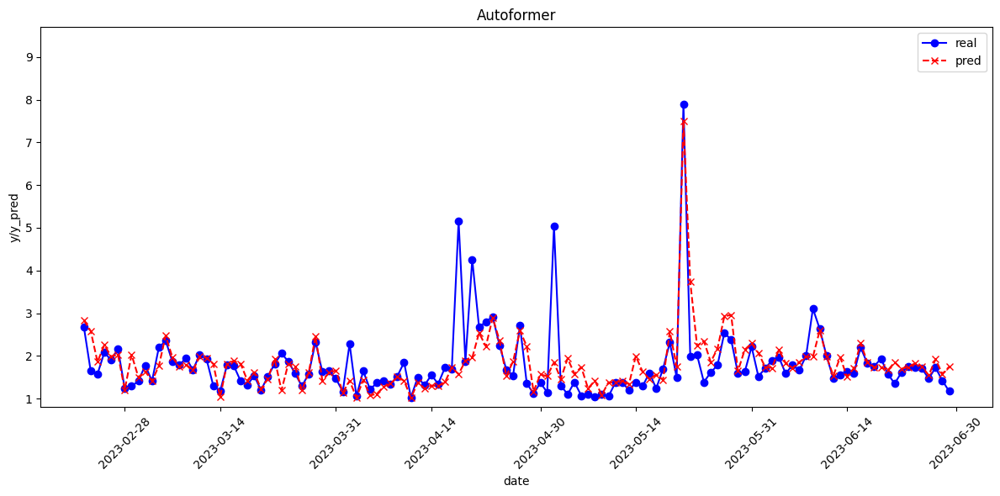

In [ ]:
plt.figure(figsize=(12, 6))

# 绘制真实值（测试集）
plt.plot(dates, test_Y_df3['y'], label='real', color='blue', marker='o')

# 绘制预测值
plt.plot(dates, Y_pred, label='pred', color='red', linestyle='--', marker='x')

# 添加图例
plt.legend()

# 设置标题和标签
plt.title('Autoformer')
plt.xlabel('date')
plt.ylabel('y/y_pred')
 #Fit of out-of-sample predicted and true values
# 旋转 x 轴的标签，防止日期显示不清楚
plt.xticks(rotation=45)
# 设置 y 轴范围，调整 y 轴最小值和最大值
plt.ylim(0.8,9.7)  # 将 y 轴范围缩小到 [-0.5, 0.5]
# 显示图形
plt.tight_layout()
plt.show()

In [ ]:
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error
import numpy as np
Y = test_Y_df3['y']
# 计算均方误差 (MSE)
mse = mean_squared_error(Y_pred, Y)

# 计算均方根误差 (RMSE)
rmse = np.sqrt(mse)
mae = mean_absolute_error(Y_pred, Y)
print("RMSE:", rmse)
print("MAE:", mae)


RMSE: 0.5809398583901875
MAE: 0.3408415875047117


### 7.基准模型har-rv

In [ ]:
import pandas as pd
import numpy as np
import statsmodels.api as sm

# Set random seed for reproducibility
np.random.seed(123)

# Read in data
rv_daily = Y_df1

# Filter out rows with missing values
rv_daily = rv_daily.dropna()

# Store predictions in a list
pred = []

# Length of the dataset minus the number of training observations（后面减去的是训练集个数）
lengthr = len(rv_daily['value']) - 1106

# Rolling forecast
for i in range(lengthr):
    # Training set range
    train_start = i  # Start at the very beginning
    train_end = 1105 + i  # i加上的是训练集个数减一

    # Extract training and test data
    train_data = rv_daily.iloc[train_start:train_end + 1]
    test_data = rv_daily.iloc[train_end + 1 ]

    # Ensure that train_data has lag variables

    # Define training predictors and response
    X_train = train_data[['lag1', 'lag5', 'lag22']]
    y_train = train_data['value']

    # Add constant to the model (intercept)
    X_train = sm.add_constant(X_train)

    # Fit the model
    har_rv = sm.OLS(y_train, X_train).fit()

    # Prepare test data for prediction (same predictors as the training data)
    X_test = test_data[['lag1', 'lag5', 'lag22']].values.reshape(1, -1)  # Ensure it's 2D
    X_test = sm.add_constant(X_test, has_constant='add')  # Add constant to test data

    # Predicting the next value
    forecast_value = har_rv.predict(X_test)

    # Store the predicted value
    pred.append(forecast_value[0])

# Output predictions
print(pred)


[2.5479377317713268, 2.2615995421851007, 2.6479435016189488, 2.4313350217341574, 2.852572746495728, 2.64096844389437, 2.2552987875870665, 2.2023194820592895, 2.032090828249902, 2.0326239598951883, 2.137133148397017, 2.2029360901652884, 1.9099050104879498, 2.0526197747087056, 1.8531023063631293, 2.123654631086538, 1.807461551927597, 1.755368092361281, 1.6551217763454855, 1.6087888943479487, 1.7479842703075779, 1.7032853997538404, 1.6261287622462886, 1.7956977270759238, 1.9934481502546073, 1.5402314749858546, 1.7249357290414165, 1.711747943785789, 2.0630968813295696, 1.6095344454145784, 1.7280125839471376, 1.7701389952552748, 1.4903127489570074, 1.4265553691183888, 1.5063429959157408, 1.3686077251234705, 1.7891053257145058, 1.5562928063350447, 2.128270184895082, 1.8511117942517874, 1.9496727132613199, 1.7342346921557732, 1.790247283945816, 1.9791374768650232, 3.0898551003471804, 1.9750382838231841, 2.1766860671729473, 1.8694329297112955, 2.1416535974058273, 2.470473780548636, 2.151373129

In [ ]:
# 转换为 DataFrame 一列
pred = pd.DataFrame(pred, columns=["Pred"])

# 查看结果
print(pred)

         Pred
0    2.547938
1    2.261600
2    2.647944
3    2.431335
4    2.852573
..        ...
379  1.799212
380  1.798196
381  1.744331
382  1.819174
383  1.716471

[384 rows x 1 columns]


### 8.绘制harrv测试集图像并计算基于harrv的nbeatsx的R方

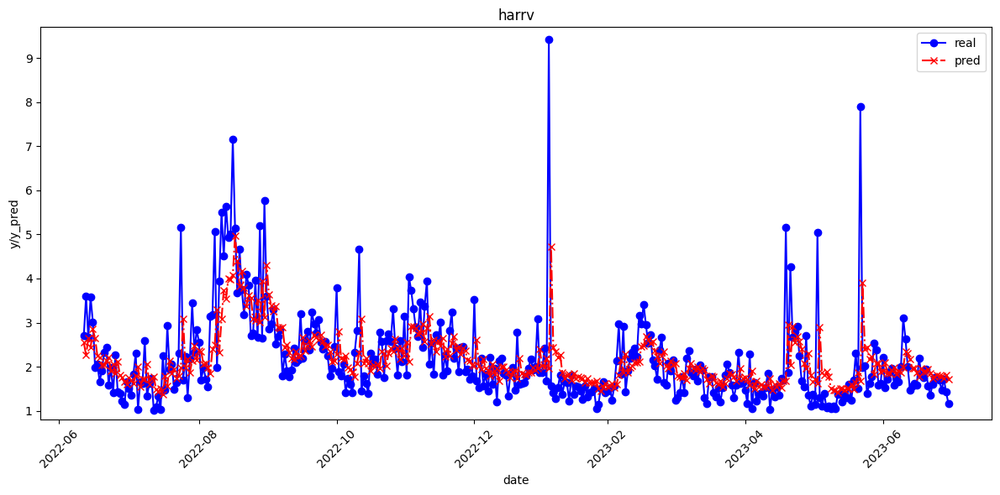

In [ ]:
plt.figure(figsize=(12, 6))

# 绘制真实值（测试集）
plt.plot(dates, test_Y_df3['y'], label='real', color='blue', marker='o')

# 绘制预测值
plt.plot(dates, pred['Pred'], label='pred', color='red', linestyle='-.', marker='x')

# 添加图例
plt.legend()

# 设置标题和标签
plt.title('harrv')
plt.xlabel('date')
plt.ylabel('y/y_pred')

# 旋转 x 轴的标签，防止日期显示不清楚
plt.xticks(rotation=45)
# 设置 y 轴范围，调整 y 轴最小值和最大值
plt.ylim(0.8, 9.7)
# 显示图形
plt.tight_layout()
plt.show()

In [ ]:
molecular = np.sum((Y_pred['Values'] - Y)**2)
print(molecular)
denominator = np.sum((pred['Pred'] - Y)**2)
print(denominator)

129.59658972150186
304.61289478952386


In [ ]:
r2 = 1 - molecular/denominator
print(r2)

0.5745531724418684


In [ ]:
#rmse mae of harrv
mse_har = mean_squared_error(pred, Y)

rmse_har = np.sqrt(mse_har)

mae_har = mean_absolute_error(pred, Y)

print(rmse_har)
print(mae_har )

0.890652989018573
0.5443646190755425


In [ ]:
import pandas as pd

# 假设 Y_pred 和 Pred 是 pandas DataFrame 或 Series
Y_pred_df = pd.DataFrame(Y_pred, columns=['Values'])  # 将 Y_pred 转换为 DataFrame
Pred_df = pd.DataFrame(pred, columns=['Pred'])  # 将 Pred 转换为 DataFrame

# 合并为一个文件，或者分别保存
result_df = pd.concat([Y_pred_df, Pred_df], axis=1)  # 按列合并

# 保存为 CSV 文件
result_df.to_csv('predictions_autoformer_har_128_noexpanding.csv', index=False)

